In [1]:
import os
import sys

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

sys.path.append(os.path.join(os.getcwd(), "..", ".."))
from baseVR.base_functionality import init_import_paths

init_import_paths()

import analytics_processing.analytics_constants as C
from analytics_processing import analytics
from analytics_processing.modality_loading import session_modality_from_nas
from analytics_processing.sessions_from_nas_parsing import fullfnames2snames
from analytics_processing.sessions_from_nas_parsing import sessionlist_fullfnames_from_args
from CustomLogger import CustomLogger as Logger
from dashsrc.plot_components.plot_wrappers.data_selection import group_filter_data


In [2]:
output_dir = "/mnt/SpatialSequenceLearning/Samed/hmm_actions"
data = {}
nas_dir = C.device_paths()[0]
Logger().init_logger(None, None, logging_level="INFO")


In [3]:
animal_ids = [6]
paradigm_ids = [1100]
session_ids = None

In [4]:
session_dirs = sessionlist_fullfnames_from_args(paradigm_ids, animal_ids, session_ids)[0]
session_names = fullfnames2snames(session_dirs)

In [5]:
framew_beh = analytics.get_analytics('BehaviorFramewise', session_names=session_names)
framew_beh

/home/samed/VirtualReality/analysisVR/analytics_processing/analytics.py:660: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  aggr = pd.concat(aggr)
2026-07-15 12:12:01,451|INFO|3054877|analytics|get_analytics
	Returning BehaviorFramewise for 34 sessions.


frame_id  frame_pc_timestamp  \
paradigm_id animal_id session_id       entry_id                                 
1100        6         2024-11-14_15-01 0            14109    1731592882746345   
                                       1            14110    1731592882763007   
                                       2            14111    1731592882779674   
                                       3            14112    1731592882797859   
                                       4            14113    1731592882814538   
...                                                   ...                 ...   
                      2025-01-27_13-39 265636      287569    1737986032936566   
                                       265637      287570    1737986032953237   
                                       265638      287571    1737986032969901   
                                       265639      287572    1737986032986570   
                                       265640      287573    1737986033003237   

                                                 frame_position  \
paradigm_id animal_id session_id       entry_id                   
1100        6         2024-11-14_15-01 0                    NaN   
                                       1                    NaN   
                                       2                    NaN   
                                       3                    NaN   
                                       4                    NaN   
...                                                         ...   
                      2025-01-27_13-39 265636         -166.7919   
                                       265637         -166.7178   
                                       265638         -166.6485   
                                       265639         -166.5945   
                                       265640         -166.5251   

                                                 frame_ephys_timestamp  \
paradigm_id animal_id session_id       entry_id                          
1100        6         2024-11-14_15-01 0                           NaN   
                                       1                           NaN   
                                       2                           NaN   
                                       3                           NaN   
                                       4                           NaN   
...                                                                ...   
                      2025-01-27_13-39 265636             4.435022e+09   
                                       265637             4.435039e+09   
                                       265638             4.435056e+09   
                                       265639             4.435072e+09   
                                       265640             4.435089e+09   

                                                 trial_id frame_ephys_patched  \
paradigm_id animal_id session_id       entry_id                                 
1100        6         2024-11-14_15-01 0              NaN                None   
                                       1              NaN                None   
                                       2              NaN                None   
                                       3              NaN                None   
                                       4              NaN                None   
...                                                   ...                 ...   
                      2025-01-27_13-39 265636       152.0                   0   
                                       265637       152.0                   0   
                                       265638       152.0                   0   
                                       265639       152.0                   0   
                                       265640       152.0                   0   

                                                       fps track_zone  \
paradigm_id animal_id session_id 

In [6]:
framew_beh.columns.tolist()

['frame_id',
 'frame_pc_timestamp',
 'frame_position',
 'frame_ephys_timestamp',
 'trial_id',
 'frame_ephys_patched',
 'fps',
 'track_zone',
 'track_zone_int',
 'from_cm_position_bin',
 'to_cm_position_bin',
 'frame_velocity',
 'frame_acc',
 'frame_raw',
 'frame_yaw',
 'frame_pitch',
 'frame_raw_500msMedian',
 'frame_yaw_500msMedian',
 'frame_pitch_500msMedian',
 'frame_raw_abs_acc_500msMedian',
 'frame_yaw_abs_acc_500msMedian',
 'frame_pitch_abs_acc_500msMedian',
 'frame_RawYawPitch_abs_vel_sum',
 'frame_RawYawPitch_abs_vel_sum_500msMedian',
 'frame_RawYawPitch_abs_acc_sum_500msMedian',
 'frame_YawPitch_abs_vel_sum_500msMedian',
 'frame_YawPitch_abs_acc_sum_500msMedian',
 'forward_vs_rotation_corr',
 'frame_forward_prop',
 'frame_below_velocity_thr',
 'lick_count',
 'lick_mean_value',
 'reward-removed_count',
 'reward-removed_mean_value',
 'reward-sound_count',
 'reward-sound_mean_value',
 'reward-valve-open_count',
 'reward-valve-open_mean_value',
 'lick_detected',
 'reward-removed_d

In [7]:
action_cols = [
               'frame_raw', 
               'frame_raw_500msMedian', 
               'frame_yaw', 
               'frame_pitch', 
               'frame_raw_abs_acc_500msMedian', 
               'frame_YawPitch_abs_vel_sum_500msMedian', 
               'frame_YawPitch_abs_acc_sum_500msMedian', 
               'frame_RawYawPitch_abs_vel_sum',
               'frame_RawYawPitch_abs_vel_sum_500msMedian',
               'frame_RawYawPitch_abs_acc_sum_500msMedian',
               'lick_detected', 
               'trial_id', 
               'trial_outcome', 
               'choice_R1', 
               'frame_forward_prop',
               'velocity_threshold_at_R1',
               'forward_vs_rotation_corr',
               
               'frame_below_velocity_thr'
               ]
framew_beh['frame_below_velocity_thr'] = framew_beh['frame_below_velocity_thr'].fillna(0)
actions = framew_beh[action_cols].dropna()

actions

frame_raw  \
paradigm_id animal_id session_id       entry_id              
1100        6         2024-11-14_15-01 88        14.899892   
                                       89        20.620413   
                                       90        24.251396   
                                       91        27.930426   
                                       92        30.082838   
...                                                    ...   
                      2025-01-27_13-39 265636     5.276067   
                                       265637     4.439806   
                                       265638     4.164066   
                                       265639     3.237747   
                                       265640     4.163317   

                                                 frame_raw_500msMedian  \
paradigm_id animal_id session_id       entry_id                          
1100        6         2024-11-14_15-01 88                    21.552511   
                                       89                    21.552511   
                                       90                    22.435904   
                                       91                    24.799924   
                                       92                    25.488759   
...                                                                ...   
                      2025-01-27_13-39 265636                 5.321221   
                                       265637                 5.366375   
                                       265638                 5.688945   
                                       265639                 6.011516   
                                       265640                 6.013681   

                                                 frame_yaw  frame_pitch  \
paradigm_id animal_id session_id       entry_id                           
1100        6         2024-11-14_15-01 88         1.141520    -3.193374   
                                       89         1.596786    -3.899736   
                                       90         0.837265    -3.903716   
                                       91         0.152102    -3.191267   
                                       92         0.304460    -3.903716   
...                                                    ...          ...   
                      2025-01-27_13-39 265636     5.936971     0.000000   
                                       265637     6.617240     0.000000   
                                       265638     7.685310     0.000000   
                                       265639     7.302658     0.000000   
                                       265640     9.053339     0.000000   

                                                 frame_raw_abs_acc_500msMedian  \
paradigm_id animal_id session_id       entry_id                                  
1100        6         2024-11-14_15-01 88                         1.136868e-13   
                                       89                         2.652743e+01   
                                       90                         9.738852e+01   
                                       91                         9.154655e+01   
                                       92                         2.068059e+01   
...                                                                        ...   
                      2025-01-27_13-39 265636                     2.709505e+00   
                                       265637                     1.103464e+01   
                                       265638                     1.935439e+01   
                                       265639                     9.740134e+00   
                                       265640                     1.298893e-01   

                                                 frame_YawPitch_abs_vel_sum_500msMedian  \
paradigm_id animal_id session_id       entry_id                                           
1100        6         2024-11-14_15-01 88             

In [8]:
actions_cp = actions.copy()
actions_cp['track_zone'] = framew_beh.loc[actions.index, 'track_zone']
actions_cp['trial_id'] = framew_beh.loc[actions.index, 'trial_id']
actions_cp.reset_index(inplace=True)
actions_cp

nframes_pre, nframes_post = 65, 125
def around_r1_entries(group):
    r1_idx = group[group['track_zone'] == 'reward1Zone'].index[0]
    return np.arange(r1_idx - nframes_pre, r1_idx + nframes_post)

r1_entries = actions_cp.groupby(by=['session_id', 'trial_id']).apply(around_r1_entries, )

r1_entries = np.concatenate(r1_entries.values)
print(r1_entries.shape)
print(f"Slicing to {nframes_pre} frames before and {nframes_post} frames after R1 entry gives us {len(r1_entries)}/{len(actions_cp)} frames to analyze around R1 entries.")

actions = actions.iloc[r1_entries]
actions['frame_id_from_start'] = actions.groupby(by=['session_id', 'trial_id']).cumcount()

(690270,)
Slicing to 65 frames before and 125 frames after R1 entry gives us 690270/4086529 frames to analyze around R1 entries.


/tmp/ipykernel_3054877/2928987130.py:12: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  r1_entries = actions_cp.groupby(by=['session_id', 'trial_id']).apply(around_r1_entries, )
/tmp/ipykernel_3054877/2928987130.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  actions['frame_id_from_start'] = actions.groupby(by=['session_id', 'trial_id']).cumcount()


In [9]:
actions['trial_id']

paradigm_id  animal_id  session_id        entry_id
1100         6          2024-11-14_15-01  374           1.0
                                          375           1.0
                                          376           1.0
                                          377           1.0
                                          378           1.0
                                                      ...  
                        2025-01-27_13-39  263456      152.0
                                          263457      152.0
                                          263458      152.0
                                          263459      152.0
                                          263460      152.0
Name: trial_id, Length: 690270, dtype: float64

In [10]:
actions = actions.set_index(['trial_id', 'frame_id_from_start'], append=True).reset_index(level=[0,1,3])
actions

paradigm_id  animal_id  \
session_id       trial_id frame_id_from_start                           
2024-11-14_15-01 1.0      0                           1100          6   
                          1                           1100          6   
                          2                           1100          6   
                          3                           1100          6   
                          4                           1100          6   
...                                                    ...        ...   
2025-01-27_13-39 152.0    185                         1100          6   
                          186                         1100          6   
                          187                         1100          6   
                          188                         1100          6   
                          189                         1100          6   

                                               entry_id  frame_raw  \
session_id       trial_id frame_id_from_start                        
2024-11-14_15-01 1.0      0                         374  31.552475   
                          1                         375  36.903671   
                          2                         376  42.198404   
                          3                         377  44.223676   
                          4                         378  43.948758   
...                                                 ...        ...   
2025-01-27_13-39 152.0    185                    263456  45.121784   
                          186                    263457  47.574310   
                          187                    263458  49.688209   
                          188                    263459  54.582433   
                          189                    263460  53.571223   

                                               frame_raw_500msMedian  \
session_id       trial_id frame_id_from_start                          
2024-11-14_15-01 1.0      0                                29.658125   
                          1                                34.228073   
                          2                                39.551037   
                          3                                43.073581   
                          4                                44.086217   
...                                                              ...   
2025-01-27_13-39 152.0    185                              47.743659   
                          186                              47.613437   
                          187                              47.276899   
                          188                              46.213858   
                          189                              45.285005   

                                               frame_yaw  frame_pitch  \
session_id       trial_id frame_id_from_start                           
2024-11-14_15-01 1.0      0                    -0.989139    -2.571977   
                          1                    -2.966171    -3.812020   
                          2                    -3.196063    -6.386365   
                          3                    -2.282354    -9.311214   
                          4                    -1.141246   -11.617545   
...                                                  ...          ...   
2025-01-27_13-39 152.0    185                  12.165258   -14.977634   
                          186                  10.351020   -12.242737   
                          187                  10.500090   -10.642664   
                          188                   9.889609    -8.867291   
                          189                   9.510380    -7.094684   

                                               frame_raw_abs_acc_500msMedian  \
session_id       trial_id frame_id_from_start                                  
2024-11-14_15-01 1.0      0                                       252.388291   
                          1                                

In [11]:
plt.close("all")

def plot_all_sessions_vel_props_fast(
    all_data,
    hmm_labels_df,
    target_cluster=3,
    y_col="frame_raw_500msMedian",
    color_col="frame_forward_prop",
    cmap="RdBu_r",
    color_vmin=0.3,
    color_vmax=0.7,
    x_lim=(0, 180),
    y_lim=(0, 150),
):
    wanted = hmm_labels_df[hmm_labels_df["cluster_k_id"] == target_cluster]
    if wanted.empty:
        print(f"No trials found for cluster {target_cluster}.")
        return

    wanted_pairs = pd.MultiIndex.from_arrays(
        [
            wanted.index.get_level_values("session_id"),
            wanted.index.get_level_values("trial_id"),
        ],
        names=["session_id", "trial_id"],
    ).unique()

    pair_index_all = pd.MultiIndex.from_arrays(
        [
            all_data.index.get_level_values("session_id"),
            all_data.index.get_level_values("trial_id"),
        ],
        names=["session_id", "trial_id"],
    )
    keep_mask = pair_index_all.isin(wanted_pairs)
    data_sub = all_data[keep_mask]

    if data_sub.empty:
        print("No overlap between selected cluster trials and all_data index.")
        return

    if color_vmin is None or color_vmax is None:
        q = data_sub[color_col].quantile([0.05, 0.95]).values
        if color_vmin is None:
            color_vmin = float(q[0])
        if color_vmax is None:
            color_vmax = float(q[1])

    fig = plt.figure(figsize=(10, 4))
    gs = fig.add_gridspec(1, 3, width_ratios=[1, 1, 0.05], wspace=0.3)
    ax0 = fig.add_subplot(gs[0, 0])
    ax1 = fig.add_subplot(gs[0, 1], sharey=ax0)
    ax = [ax0, ax1]
    cax = fig.add_subplot(gs[0, 2])

    stop_y, stop_c = [], []
    skip_y, skip_c = [], []
    total_trials = 0
    n_stop = 0
    labeled = False

    grouped = data_sub.groupby(level=["session_id", "trial_id"], sort=False)
    
    if y_lim is None:
        y_lim_upper = data_sub[y_col].quantile(0.99)
        ylim_lower = data_sub[y_col].quantile(0.01)
        y_lim = (ylim_lower, y_lim_upper)

    for (_, _), trial_data in grouped:
        trial_data = trial_data.reset_index(drop=True)
        if trial_data.empty:
            continue

        y_vals = trial_data[y_col].to_numpy()
        c_vals = trial_data[color_col].to_numpy()
        if np.all(np.isnan(y_vals)) or np.all(np.isnan(c_vals)):
            continue

        total_trials += 1
        is_stop = trial_data.iloc[0]["choice_R1"] > 0
        ax_i = 1 if is_stop else 0
        x = np.arange(len(trial_data))

        if is_stop:
            n_stop += 1
            stop_y.append(y_vals)
            stop_c.append(c_vals)
        else:
            skip_y.append(y_vals)
            skip_c.append(c_vals)

        ax[ax_i].scatter(
            x, y_vals, c=c_vals,
            alpha=0.12, s=6, cmap=cmap,
            vmin=color_vmin, vmax=color_vmax, linewidths=0
        )

        if is_stop and "frame_below_velocity_thr" in trial_data.columns:
            r_time = trial_data.loc[
                trial_data["frame_below_velocity_thr"].astype(bool), y_col
            ].iloc[0:1]
            if not r_time.empty:
                ax[ax_i].scatter(
                    r_time.index, r_time.values,
                    marker="|", s=120, color="k",
                    label="below reward thresh." if not labeled else None
                )
                labeled = True

    if total_trials == 0:
        plt.close(fig)
        print("No trials to plot after filtering.")
        return

    def mean_trace(arr_list):
        min_len = min(len(a) for a in arr_list)
        arr = np.vstack([a[:min_len] for a in arr_list])
        return np.nanmean(arr, axis=0), min_len

    sc_for_cbar = None
    if stop_y:
        stop_y_m, stop_len = mean_trace(stop_y)
        stop_c_m, _ = mean_trace(stop_c)
        sc_for_cbar = ax[1].scatter(
            np.arange(stop_len), stop_y_m,
            c=stop_c_m, s=30, cmap=cmap,
            vmin=color_vmin, vmax=color_vmax
        )

    if skip_y:
        skip_y_m, skip_len = mean_trace(skip_y)
        skip_c_m, _ = mean_trace(skip_c)
        sc_for_cbar = ax[0].scatter(
            np.arange(skip_len), skip_y_m,
            c=skip_c_m, s=30, cmap=cmap,
            vmin=color_vmin, vmax=color_vmax
        )

    xtick_frames = np.array([0, 60, 120])
    xtick_times = xtick_frames - 60
    y_label = y_col.replace("_", " ")

    for axis in ax:
        axis.set_xlim(*x_lim)
        if y_lim is not None:
            axis.set_ylim(*y_lim)
        axis.grid(True, axis="y", alpha=0.3)
        axis.set_xticks(xtick_frames)
        axis.set_xticklabels([f"{t/60:.1f}" for t in xtick_times])
        axis.set_ylabel(y_label)
        axis.axvline(60, color="k", linestyle="--", linewidth=1, alpha=0.6)
        axis.text(
            60, axis.get_ylim()[1] * 0.93, "reward zone entry",
            fontsize=9, ha="center",
            bbox=dict(boxstyle="round", facecolor="white", alpha=0.8),
        )
        axis.spines["top"].set_visible(False)
        axis.spines["right"].set_visible(False)

    frac_stop = 100.0 * n_stop / total_trials
    frac_skip = 100.0 - frac_stop
    ax[0].set_xlabel(f"[s], skipped ({frac_skip:.0f}%)")
    ax[1].set_xlabel(f"[s], stopped ({frac_stop:.0f}%)")
    ax[1].legend(loc="best", fontsize=8)

    if sc_for_cbar is not None:
        cbar = fig.colorbar(sc_for_cbar, cax=cax)
        cbar.set_label(color_col.replace("_", " "), rotation=270, labelpad=15)

    fig.suptitle(
        f"All sessions (cluster {target_cluster}, n={total_trials} trials)\n"
        f"y={y_col}, color={color_col}",
        y=0.98, fontsize=11
    )
    fig.tight_layout(rect=[0, 0.02, 1, 0.88])
    plt.show()

/tmp/ipykernel_3054877/263073416.py:80: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.05, 1, 0.95])


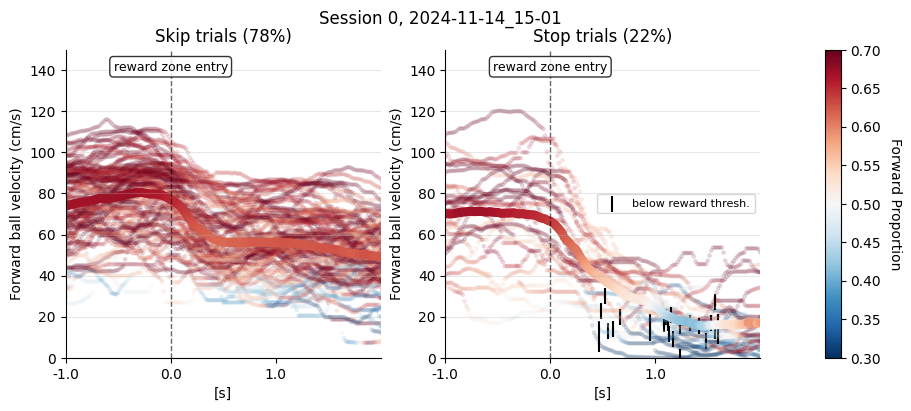

/tmp/ipykernel_3054877/263073416.py:80: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.05, 1, 0.95])


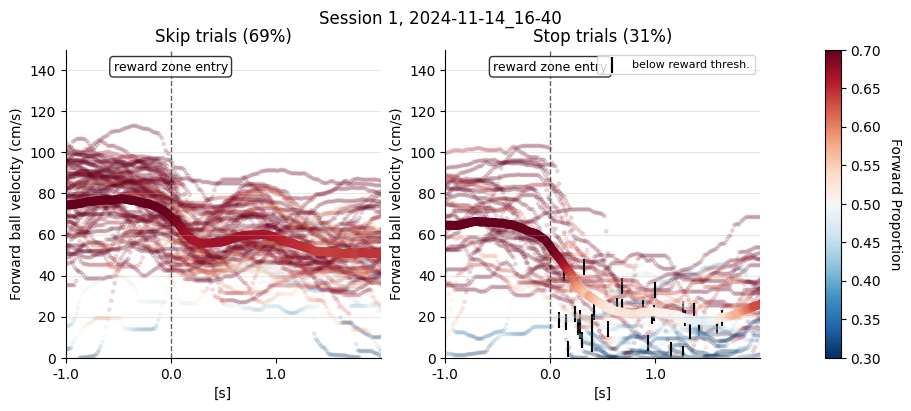

/tmp/ipykernel_3054877/263073416.py:80: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.05, 1, 0.95])


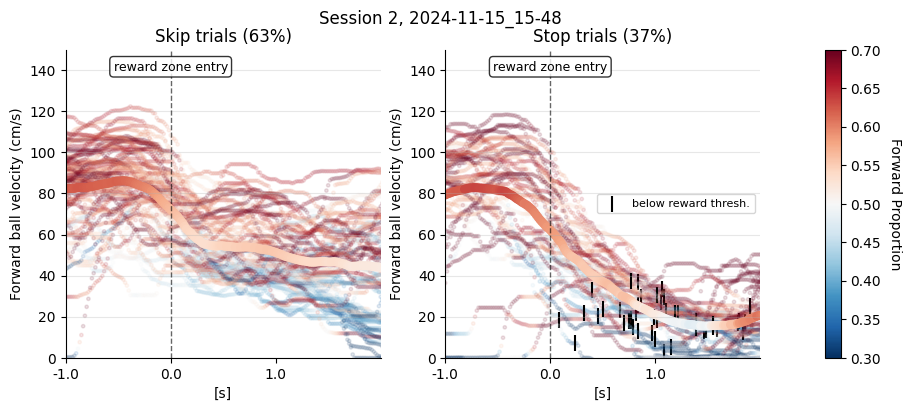

/tmp/ipykernel_3054877/263073416.py:80: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.05, 1, 0.95])


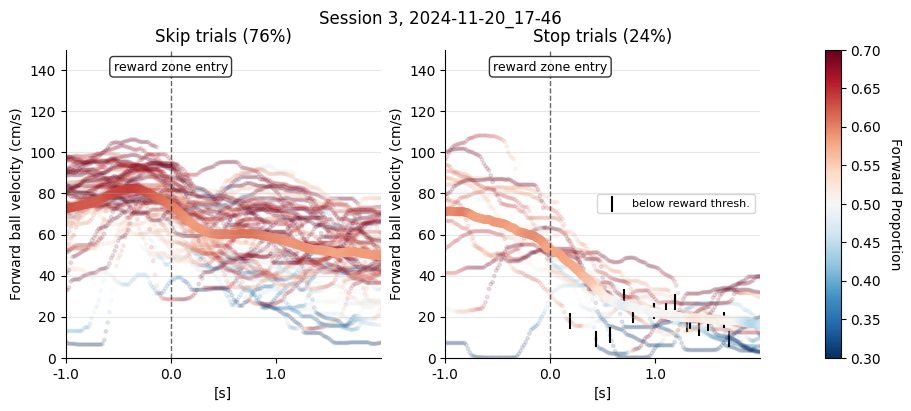

/tmp/ipykernel_3054877/263073416.py:80: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.05, 1, 0.95])


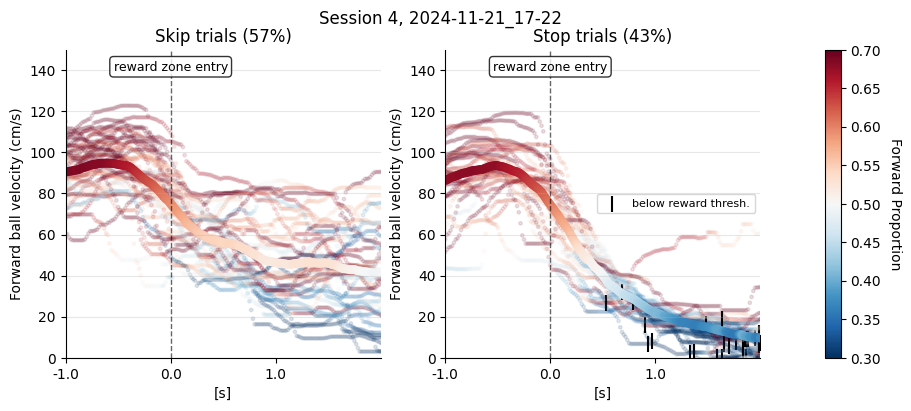

/tmp/ipykernel_3054877/263073416.py:80: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.05, 1, 0.95])


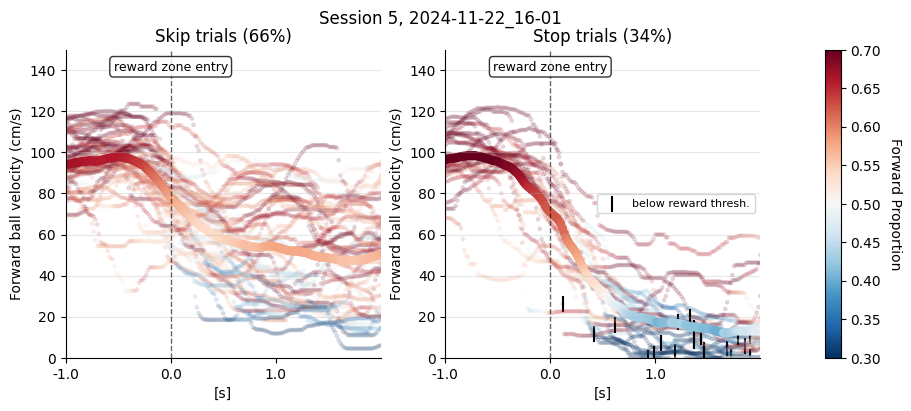

/tmp/ipykernel_3054877/263073416.py:80: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.05, 1, 0.95])


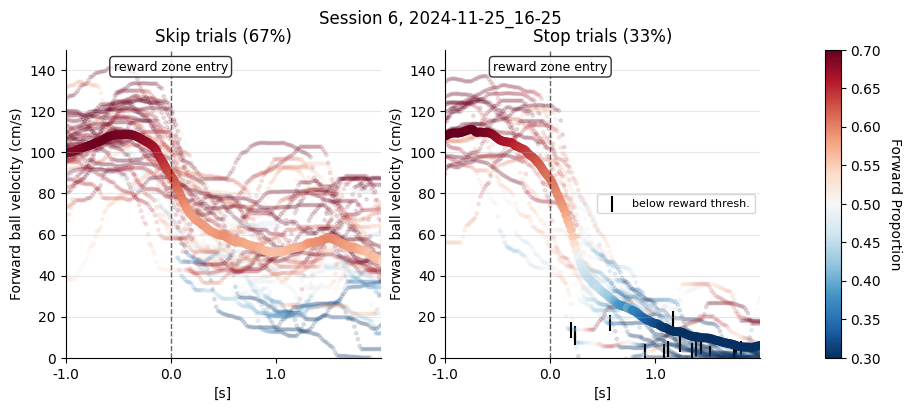

/tmp/ipykernel_3054877/263073416.py:80: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.05, 1, 0.95])


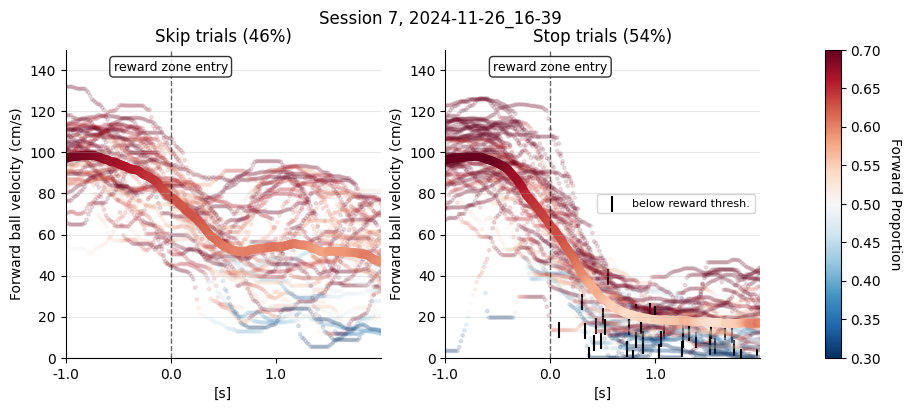

/tmp/ipykernel_3054877/263073416.py:80: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.05, 1, 0.95])


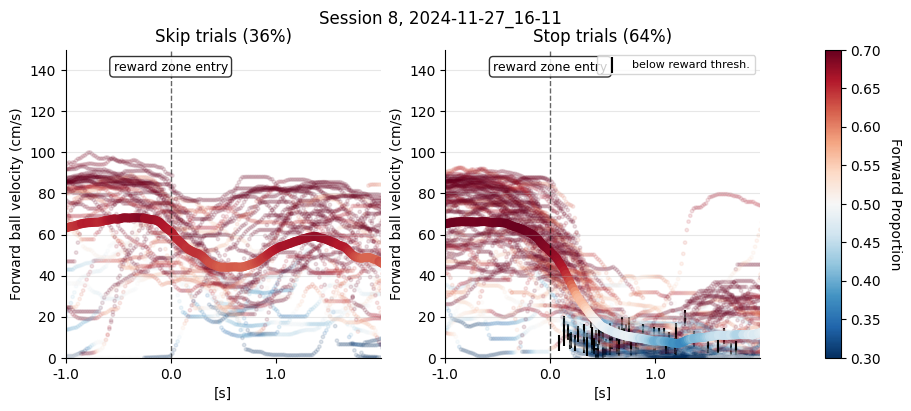

/tmp/ipykernel_3054877/263073416.py:80: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.05, 1, 0.95])


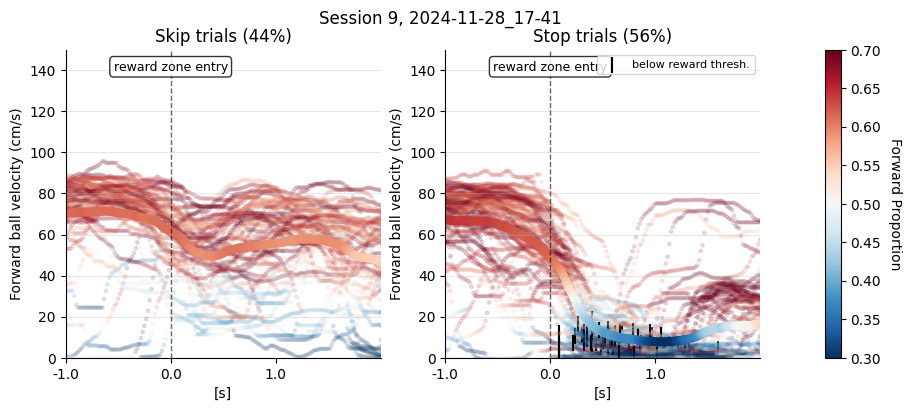

/tmp/ipykernel_3054877/263073416.py:80: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.05, 1, 0.95])


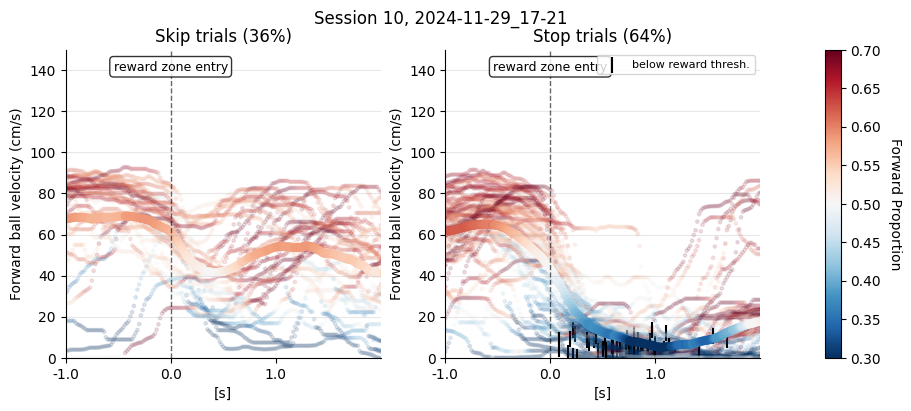

/tmp/ipykernel_3054877/263073416.py:80: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.05, 1, 0.95])


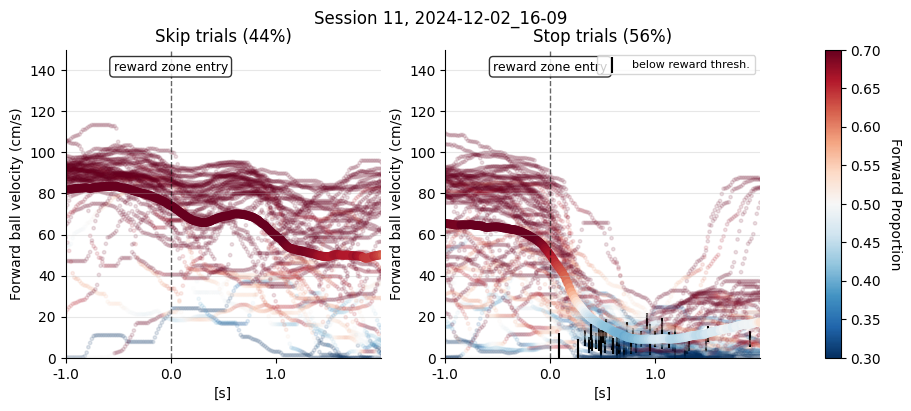

/tmp/ipykernel_3054877/263073416.py:80: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.05, 1, 0.95])


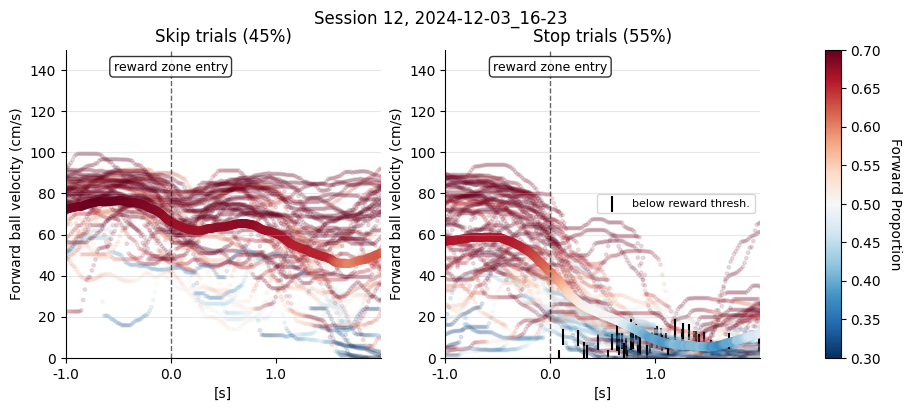

/tmp/ipykernel_3054877/263073416.py:80: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.05, 1, 0.95])


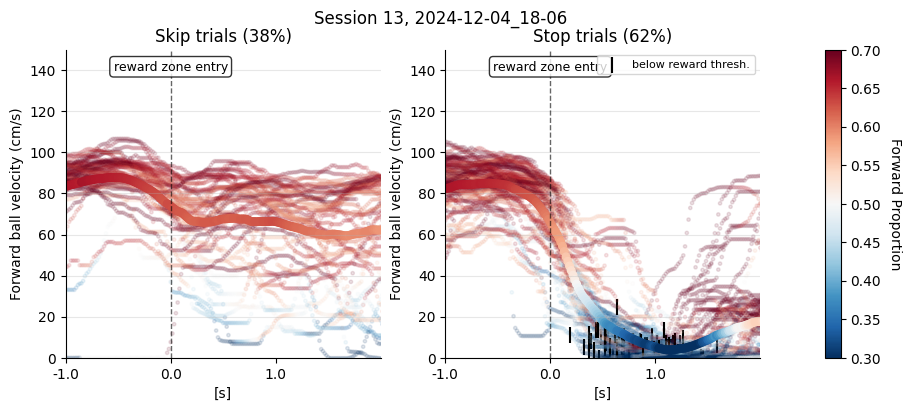

/tmp/ipykernel_3054877/263073416.py:80: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.05, 1, 0.95])


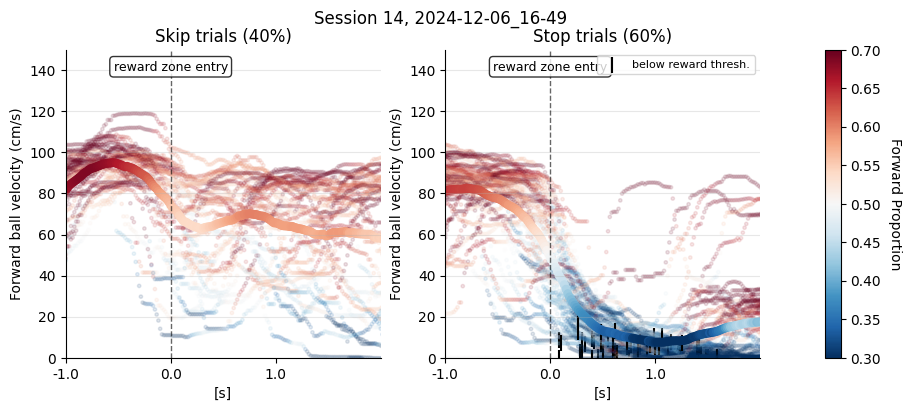

/tmp/ipykernel_3054877/263073416.py:80: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.05, 1, 0.95])


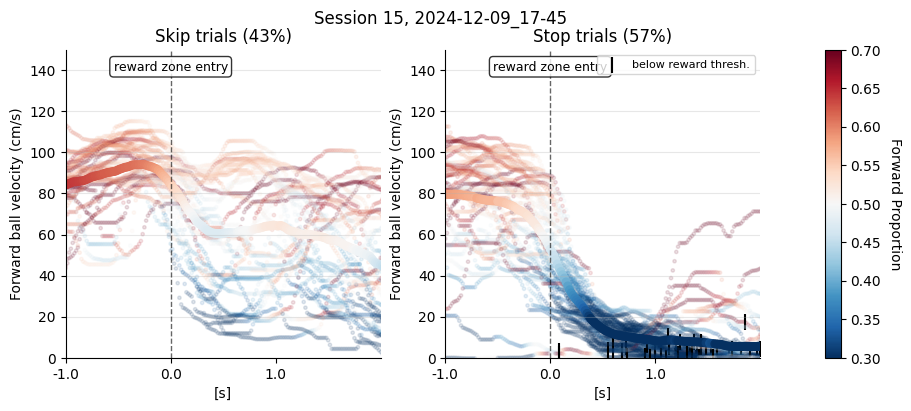

/tmp/ipykernel_3054877/263073416.py:80: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.05, 1, 0.95])


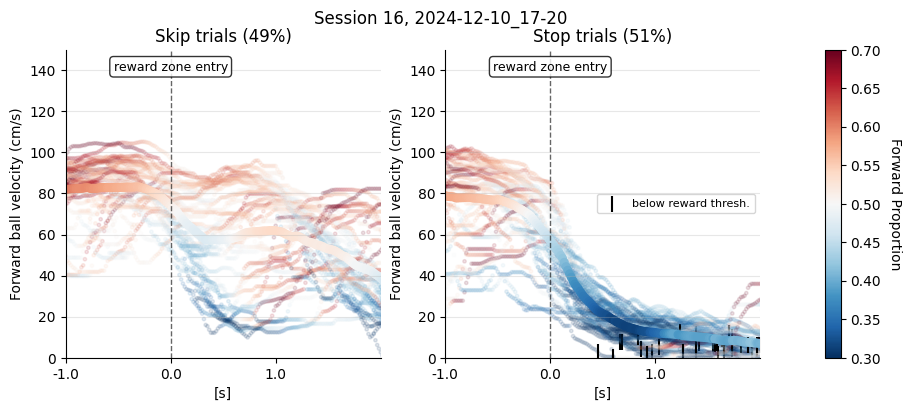

/tmp/ipykernel_3054877/263073416.py:80: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.05, 1, 0.95])


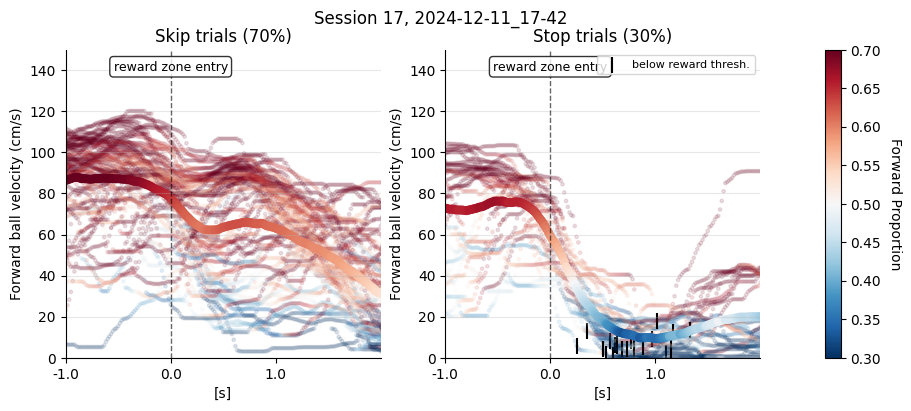

/tmp/ipykernel_3054877/263073416.py:80: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.05, 1, 0.95])


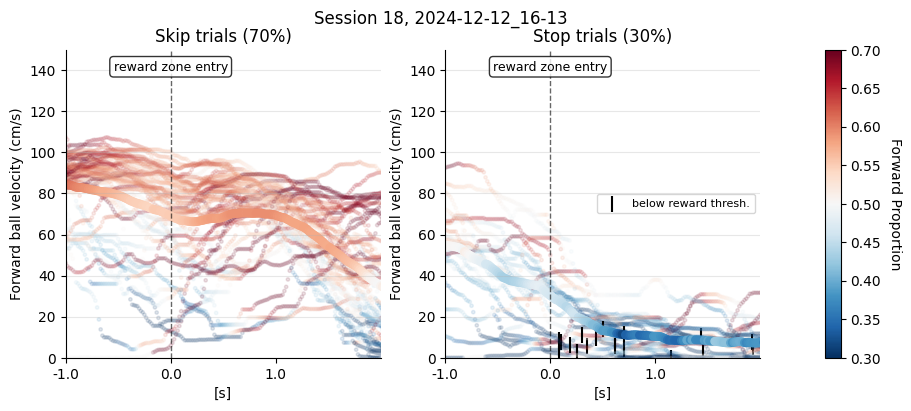

/tmp/ipykernel_3054877/263073416.py:80: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.05, 1, 0.95])


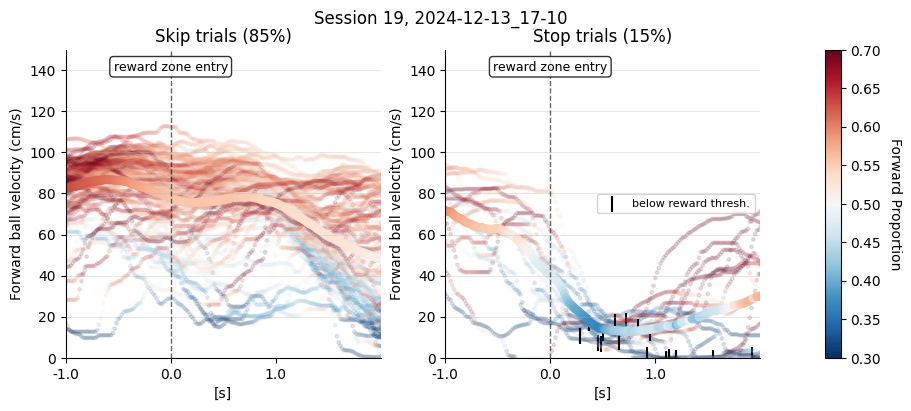

/tmp/ipykernel_3054877/263073416.py:80: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.05, 1, 0.95])


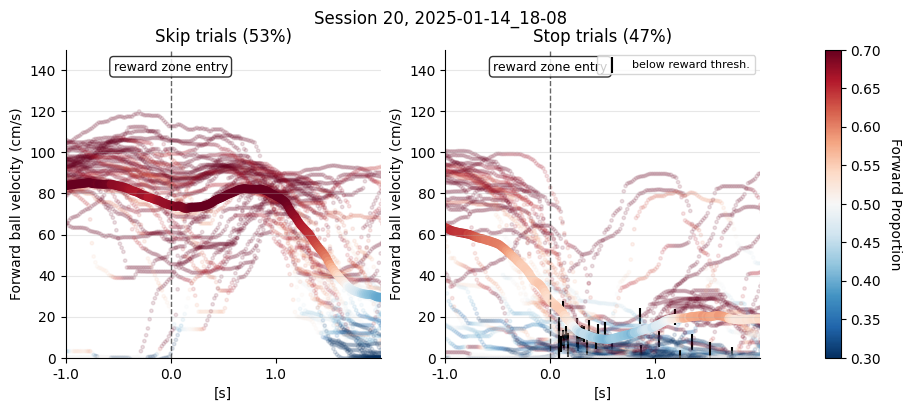

/tmp/ipykernel_3054877/263073416.py:80: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.05, 1, 0.95])


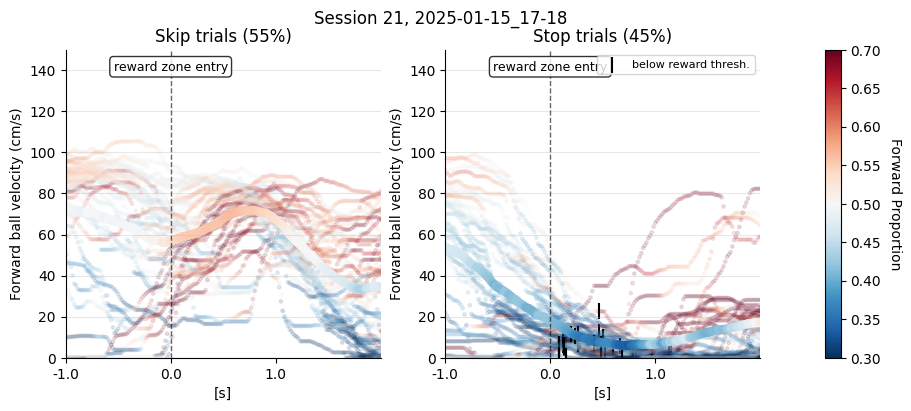

/tmp/ipykernel_3054877/263073416.py:80: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.05, 1, 0.95])


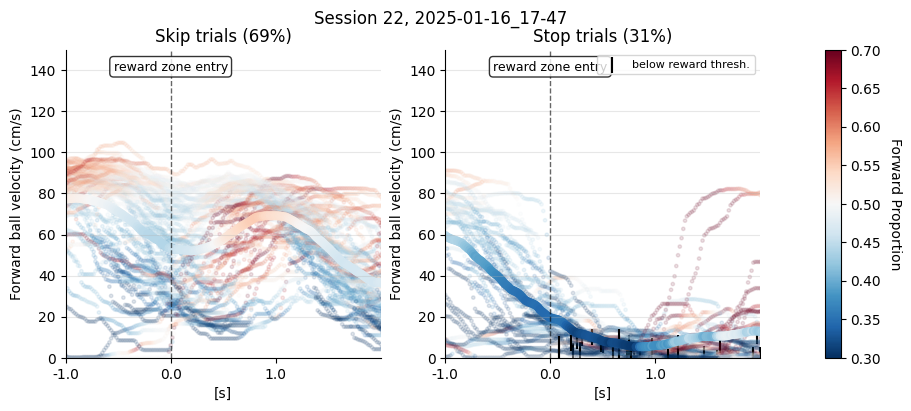

/tmp/ipykernel_3054877/263073416.py:80: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.05, 1, 0.95])


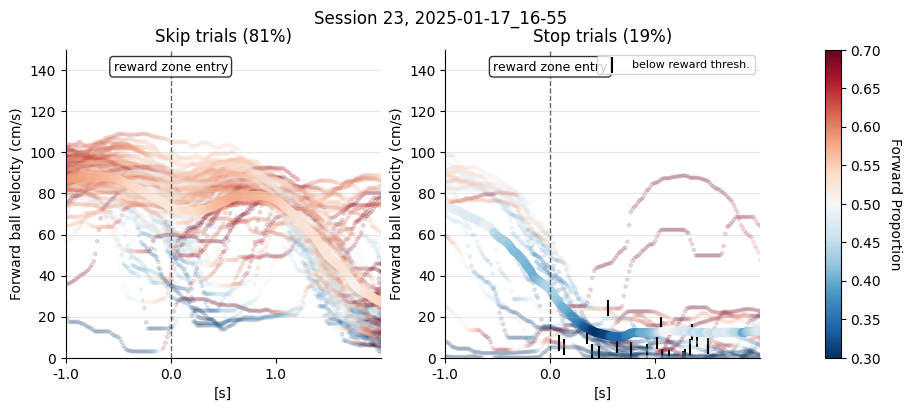

/tmp/ipykernel_3054877/263073416.py:80: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.05, 1, 0.95])


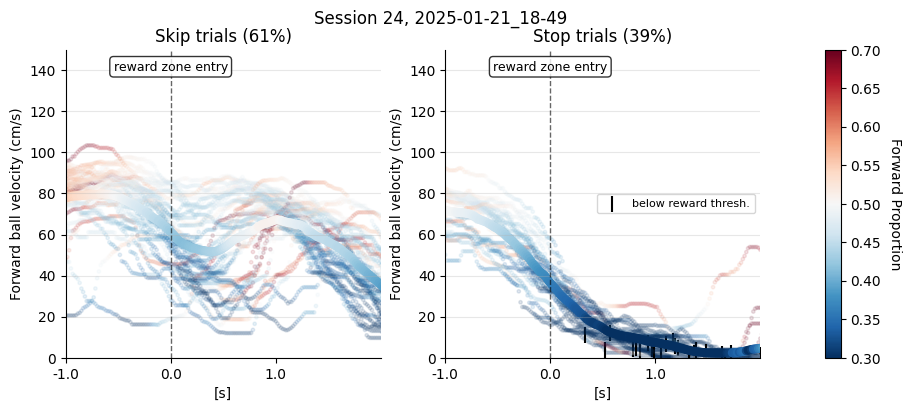

/tmp/ipykernel_3054877/263073416.py:80: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.05, 1, 0.95])


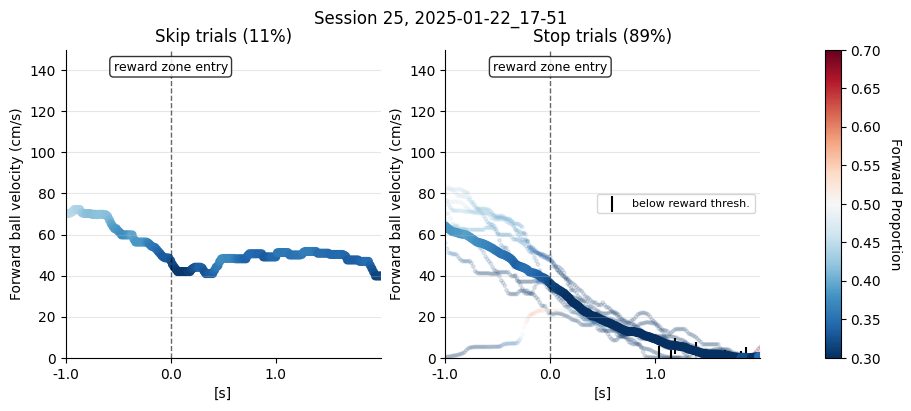

/tmp/ipykernel_3054877/263073416.py:80: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.05, 1, 0.95])


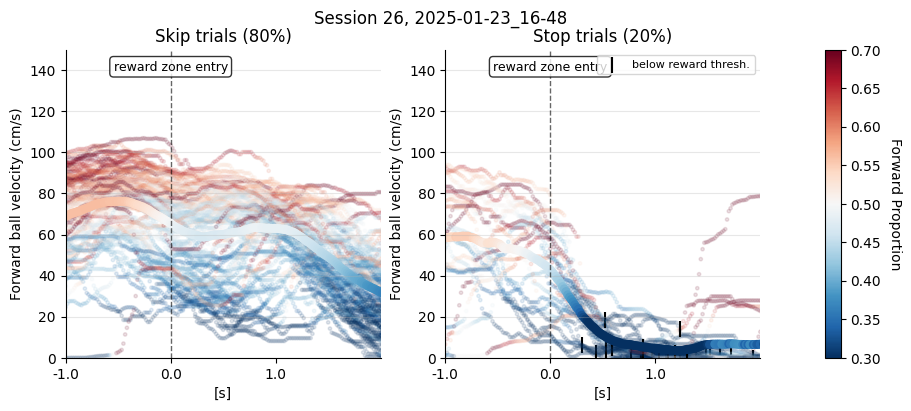

/tmp/ipykernel_3054877/263073416.py:80: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.05, 1, 0.95])


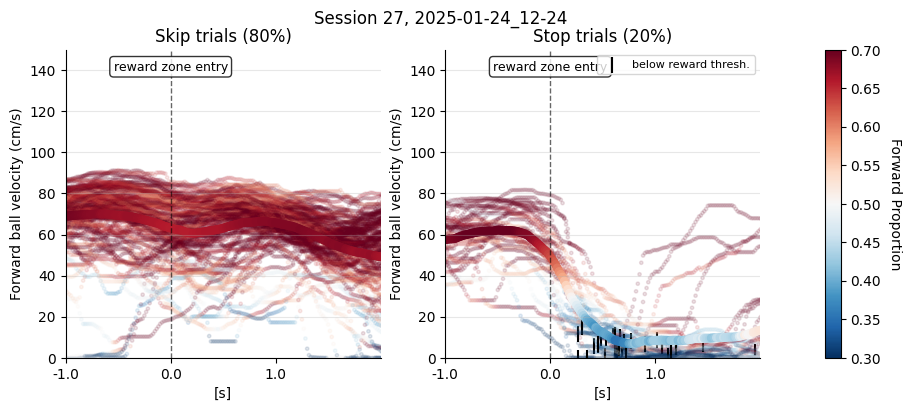

/tmp/ipykernel_3054877/263073416.py:80: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.05, 1, 0.95])


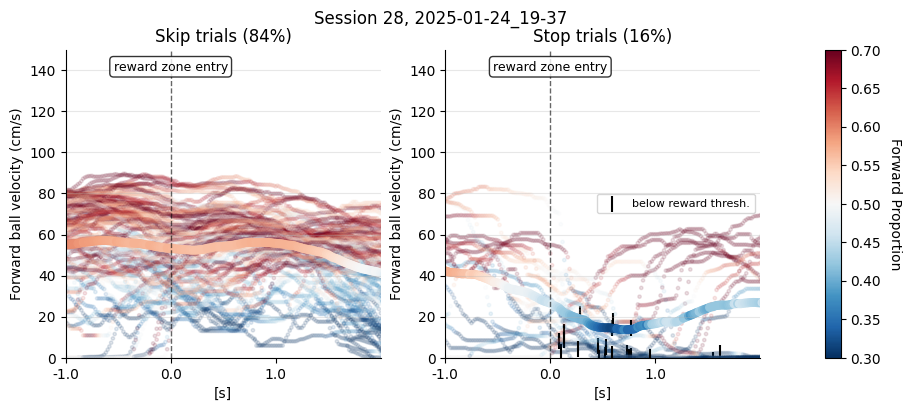

/tmp/ipykernel_3054877/263073416.py:80: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.05, 1, 0.95])


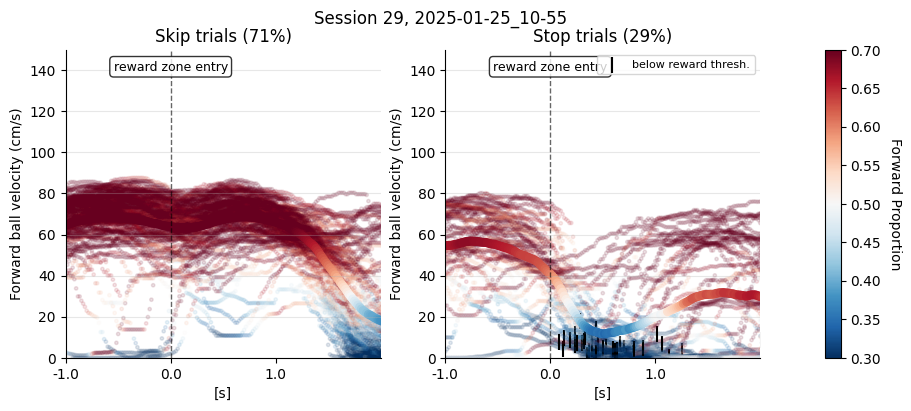

/tmp/ipykernel_3054877/263073416.py:80: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.05, 1, 0.95])


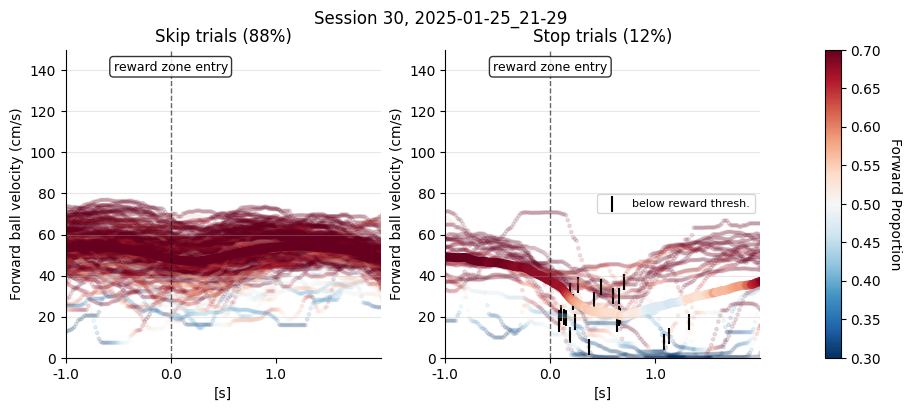

/tmp/ipykernel_3054877/263073416.py:80: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.05, 1, 0.95])


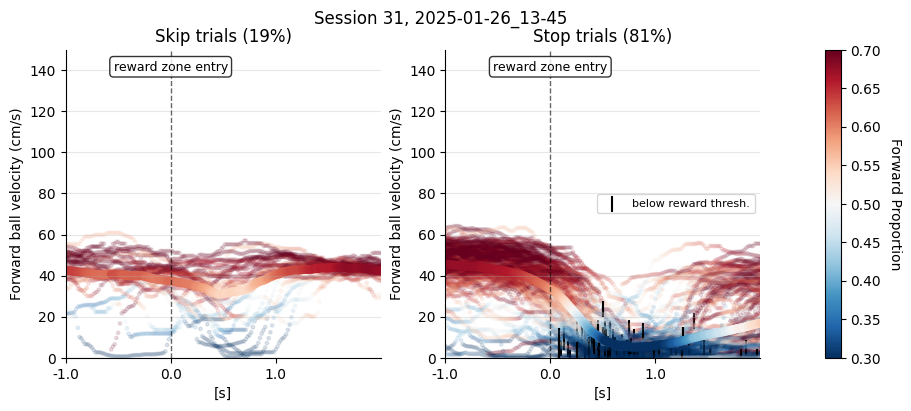

/tmp/ipykernel_3054877/263073416.py:80: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.05, 1, 0.95])


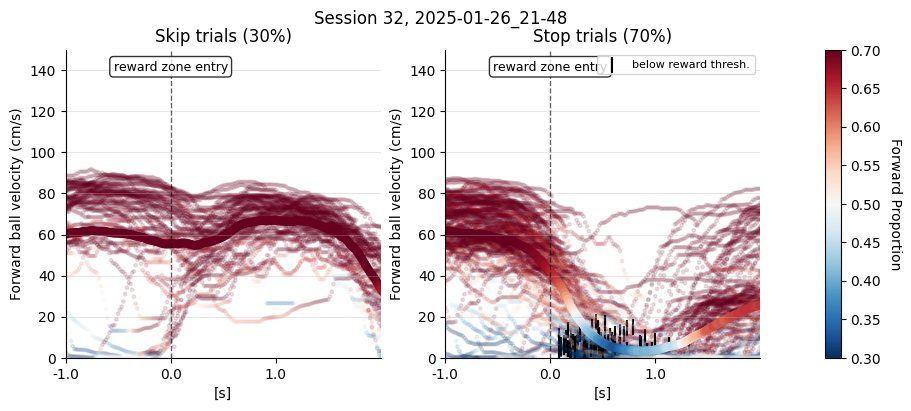

/tmp/ipykernel_3054877/263073416.py:80: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.05, 1, 0.95])


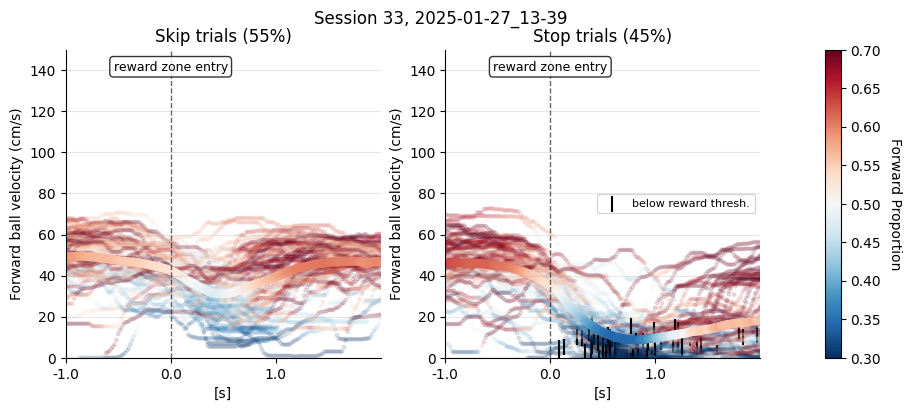

In [12]:
plt.close("all")
def plot_session_vel_props(session_data):
    fig = plt.figure(figsize=(10, 4))
    gs = fig.add_gridspec(1, 3, width_ratios=[1, 1, 0.05], wspace=0.3)
    ax = [fig.add_subplot(gs[0, 0]), fig.add_subplot(gs[0, 1])]
    cax = fig.add_subplot(gs[0, 2])
    
    n_choices = 0
    n = len(session_data.index.unique("trial_id"))
    
    stop_choices, stop_choice_c = [], []
    skip_choices, skip_choice_c = [], []
    
    sample_of_trials = session_data.index.unique("trial_id")
    
    labeled = False
    for trial_id in sample_of_trials:
        trial_mask = session_data.index.get_level_values('trial_id') == trial_id
        trial_data = session_data[trial_mask]
        trial_data = trial_data.reset_index(drop=True)
        
        ax_i = 1 if (trial_data.iloc[0]['choice_R1'] %5) >0 else 0
        
        x = np.arange(trial_data.shape[0])
        col = trial_data['frame_forward_prop'].values
        
        if ax_i:
            n_choices += ax_i
            stop_choices.append(trial_data['frame_raw_500msMedian'].values)
            stop_choice_c.append(col)
        else:
            skip_choices.append(trial_data['frame_raw_500msMedian'].values)
            skip_choice_c.append(col)
        
        sc = ax[ax_i].scatter(x, trial_data['frame_raw_500msMedian'].values, c=col, alpha=0.12, s=6, cmap='RdBu_r', vmin=.3, vmax=.7)
        
        if ax_i == 1:
            r_time = trial_data.loc[trial_data['frame_below_velocity_thr'].astype(bool), 'frame_raw_500msMedian'].iloc[0:1]
            ax[ax_i].scatter(r_time.index, r_time.values, marker='|', s=120, color='k', label='below reward thresh.' if not labeled else None)
            labeled = True

    stop_choices = np.stack(stop_choices).mean(0)
    stop_choice_c = np.stack(stop_choice_c).mean(0)
    ax[1].scatter(np.arange(len(stop_choices)), stop_choices, c=stop_choice_c, s=30, cmap='RdBu_r', vmin=.3, vmax=.7)
    
    skip_choices = np.stack(skip_choices).mean(0)
    skip_choice_c = np.stack(skip_choice_c).mean(0)
    sc = ax[0].scatter(np.arange(len(skip_choices)), skip_choices, c=skip_choice_c, s=30, cmap='RdBu_r', vmin=.3, vmax=.7)
    
    xtick_frames = np.array([0,60,120])
    xtick_times = xtick_frames-60
    
    for i, axis in enumerate(ax):
        axis.set_xlim(0, 180)
        axis.set_ylim(0, 150)
        axis.grid(True, axis='y', alpha=0.3)
        axis.set_xticks(xtick_frames)
        axis.set_xticklabels([f'{t/60:.1f}' for t in xtick_times])
        axis.set_ylabel('Forward ball velocity (cm/s)')
        axis.axvline(60, color='k', linestyle='--', linewidth=1, alpha=0.6)
        axis.text(60, 140, 'reward zone entry', fontsize=9, ha='center', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
        
        axis.spines['top'].set_visible(False)
        axis.spines['right'].set_visible(False)
    
    ax[0].set_title(f"Skip trials ({(n-n_choices)/n*100:.0f}%)")
    ax[0].set_xlabel("[s]")
    ax[1].set_xlabel("[s]")
    ax[1].set_title(f"Stop trials ({n_choices/n*100:.0f}%)")
    ax[1].legend(loc='best', fontsize=8)
    
    cbar = plt.colorbar(sc, cax=cax)
    cbar.set_label('Forward Proportion', rotation=270, labelpad=15)

        
for i, s_id in enumerate(actions.index.unique('session_id')):
    session_data = actions.loc[s_id]
    plot_session_vel_props(session_data)
    plt.suptitle(f"Session {i}, {s_id}", y=0.98)
    plt.tight_layout(rect=[0, 0.05, 1, 0.95])
    plt.show()

Session: 2024-12-09_17-45
Skip trial definition: choice_R1 <= 0
Criterion: frame_forward_prop < 0.35 for at least 10 time points
Cue filter: 1
Matching skip trials (3):
 trial_id  cue  n_low_forward_prop  n_timepoints
       57  1.0                  72           190
       68  1.0                  27           190
       74  1.0                  51           190


/tmp/ipykernel_3054877/2913537896.py:198: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.05, 1, 0.95])


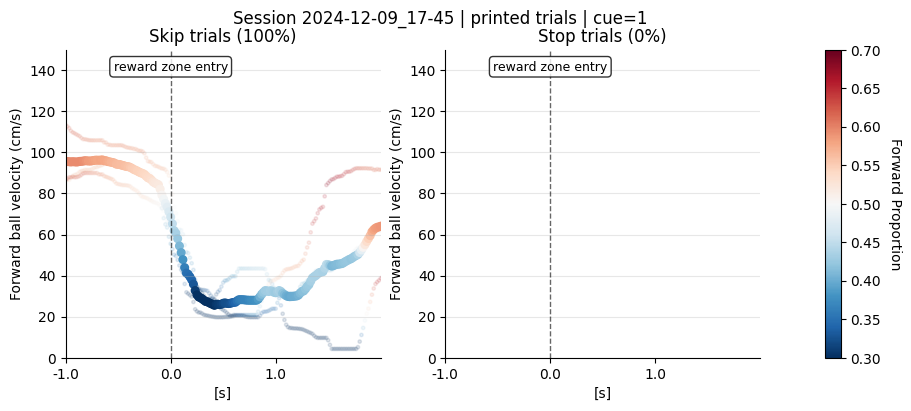

,trial_id,choice_R1,n_low_forward_prop,n_timepoints,cue
0,57,0.0,72,190,1.0
1,68,0.0,27,190,1.0
2,74,0.0,51,190,1.0


In [13]:
target_session_id = "2024-12-09_17-45"
forward_prop_threshold = 0.35
min_low_forward_prop_timepoints = 10
target_cue = 1

session_data = actions.xs(target_session_id, level="session_id")

session_framew_beh = framew_beh.xs(target_session_id, level="session_id")
cue_by_trial = (
    session_framew_beh.dropna(subset=["trial_id", "cue"])
    .groupby("trial_id")["cue"]
    .first()
    .rename("cue")
)

trial_summary = session_data.groupby(level="trial_id").agg(
    choice_R1=("choice_R1", "first"),
    n_low_forward_prop=(
        "frame_forward_prop",
        lambda s: int(s.lt(forward_prop_threshold).sum()),
    ),
    n_timepoints=("frame_forward_prop", "size"),
)
trial_summary = trial_summary.join(cue_by_trial)

matching_trials = trial_summary[
    (trial_summary["choice_R1"] <= 0)
    & (trial_summary["n_low_forward_prop"] >= min_low_forward_prop_timepoints)
]
if target_cue is not None:
    matching_trials = matching_trials[matching_trials["cue"] == target_cue]

def format_trial_id(trial_id):
    if isinstance(trial_id, (int, float, np.integer, np.floating)) and float(trial_id).is_integer():
        return int(trial_id)
    return trial_id

matching_trial_info = matching_trials.reset_index()
matching_trial_info["trial_id"] = matching_trial_info["trial_id"].map(format_trial_id)

print(f"Session: {target_session_id}")
print("Skip trial definition: choice_R1 <= 0")
print(
    f"Criterion: frame_forward_prop < {forward_prop_threshold} "
    f"for at least {min_low_forward_prop_timepoints} time points"
)
print(f"Cue filter: {target_cue if target_cue is not None else 'all cues'}")
print(f"Matching skip trials ({len(matching_trial_info)}):")
if matching_trial_info.empty:
    print([])
else:
    print(
        matching_trial_info[
            ["trial_id", "cue", "n_low_forward_prop", "n_timepoints"]
        ].to_string(index=False)
    )

matching_trial_ids = matching_trials.index.unique()
matching_session_data = session_data[
    session_data.index.get_level_values("trial_id").isin(matching_trial_ids)
]

def plot_selected_session_trials(session_data_subset, title_suffix=""):
    if session_data_subset.empty:
        print("No matching trials to plot.")
        return

    fig = plt.figure(figsize=(10, 4))
    gs = fig.add_gridspec(1, 3, width_ratios=[1, 1, 0.05], wspace=0.3)
    ax = [fig.add_subplot(gs[0, 0]), fig.add_subplot(gs[0, 1])]
    cax = fig.add_subplot(gs[0, 2])

    n_trials = len(session_data_subset.index.unique("trial_id"))
    n_stop = 0
    stop_choices, stop_choice_c = [], []
    skip_choices, skip_choice_c = [], []
    labeled = False
    sc_for_cbar = None

    sample_of_trials = session_data_subset.index.unique("trial_id")
    for trial_id in sample_of_trials:
        trial_mask = session_data_subset.index.get_level_values("trial_id") == trial_id
        trial_data = session_data_subset[trial_mask].reset_index(drop=True)
        if trial_data.empty:
            continue

        is_stop = trial_data.iloc[0]["choice_R1"] > 0
        ax_i = 1 if is_stop else 0
        x = np.arange(trial_data.shape[0])
        col = trial_data["frame_forward_prop"].values
        vel = trial_data["frame_raw_500msMedian"].values

        if is_stop:
            n_stop += 1
            stop_choices.append(vel)
            stop_choice_c.append(col)
        else:
            skip_choices.append(vel)
            skip_choice_c.append(col)

        sc_for_cbar = ax[ax_i].scatter(
            x,
            vel,
            c=col,
            alpha=0.12,
            s=6,
            cmap="RdBu_r",
            vmin=.3,
            vmax=.7,
        )

        if is_stop and "frame_below_velocity_thr" in trial_data.columns:
            r_time = trial_data.loc[
                trial_data["frame_below_velocity_thr"].astype(bool),
                "frame_raw_500msMedian",
            ].iloc[0:1]
            if not r_time.empty:
                ax[ax_i].scatter(
                    r_time.index,
                    r_time.values,
                    marker="|",
                    s=120,
                    color="k",
                    label="below reward thresh." if not labeled else None,
                )
                labeled = True

    def mean_trace(arr_list):
        min_len = min(len(a) for a in arr_list)
        arr = np.vstack([a[:min_len] for a in arr_list])
        return np.nanmean(arr, axis=0), min_len

    if stop_choices:
        stop_y, stop_len = mean_trace(stop_choices)
        stop_c, _ = mean_trace(stop_choice_c)
        sc_for_cbar = ax[1].scatter(
            np.arange(stop_len),
            stop_y,
            c=stop_c,
            s=30,
            cmap="RdBu_r",
            vmin=.3,
            vmax=.7,
        )

    if skip_choices:
        skip_y, skip_len = mean_trace(skip_choices)
        skip_c, _ = mean_trace(skip_choice_c)
        sc_for_cbar = ax[0].scatter(
            np.arange(skip_len),
            skip_y,
            c=skip_c,
            s=30,
            cmap="RdBu_r",
            vmin=.3,
            vmax=.7,
        )

    xtick_frames = np.array([0, 60, 120])
    xtick_times = xtick_frames - 60

    for axis in ax:
        axis.set_xlim(0, 180)
        axis.set_ylim(0, 150)
        axis.grid(True, axis="y", alpha=0.3)
        axis.set_xticks(xtick_frames)
        axis.set_xticklabels([f"{t/60:.1f}" for t in xtick_times])
        axis.set_ylabel("Forward ball velocity (cm/s)")
        axis.axvline(60, color="k", linestyle="--", linewidth=1, alpha=0.6)
        axis.text(
            60,
            140,
            "reward zone entry",
            fontsize=9,
            ha="center",
            bbox=dict(boxstyle="round", facecolor="white", alpha=0.8),
        )
        axis.spines["top"].set_visible(False)
        axis.spines["right"].set_visible(False)

    frac_stop = 100.0 * n_stop / n_trials if n_trials else 0.0
    frac_skip = 100.0 - frac_stop if n_trials else 0.0
    ax[0].set_title(f"Skip trials ({frac_skip:.0f}%)")
    ax[1].set_title(f"Stop trials ({frac_stop:.0f}%)")
    ax[0].set_xlabel("[s]")
    ax[1].set_xlabel("[s]")
    if labeled:
        ax[1].legend(loc="best", fontsize=8)

    if sc_for_cbar is not None:
        cbar = plt.colorbar(sc_for_cbar, cax=cax)
        cbar.set_label("Forward Proportion", rotation=270, labelpad=15)

    plt.suptitle(
        f"Session {target_session_id}{title_suffix}",
        y=0.98,
    )
    plt.tight_layout(rect=[0, 0.05, 1, 0.95])
    plt.show()

plot_selected_session_trials(
    matching_session_data,
    title_suffix=(
        f" | printed trials"
        f" | cue={target_cue if target_cue is not None else 'all'}"
    ),
)

matching_trial_info

/tmp/ipykernel_3054877/231610100.py:86: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  summary["first_forward_only_entry_id"] = grouped.apply(
/tmp/ipykernel_3054877/231610100.py:86: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  summary["first_forward_only_entry_id"] = grouped.apply(


Forward-only R1/R2 stop candidate search
R1/C1 actual skip definition: choice_R1 <= 0 in cue==1 trials
R2/C2 actual skip definition: choice_R2 <= 0 in cue==2 trials
Forward-only stop rule: abs(frame_raw) < velocity_threshold_at_R*fps inside the matching reward zone
Time criterion: at least 1 reward-zone frame below threshold; no consecutive-frame requirement
Matching trials: 474

Per-session candidate counts:
reward_zone       R1  R2
session_id              
2024-11-14_15-01  12  21
2024-11-14_16-40   6  15
2024-11-15_15-48  15  20
2024-11-20_17-46  10   7
2024-11-21_17-22   9   3
2024-11-22_16-01   9   6
2024-11-25_16-25   9   3
2024-11-26_16-39   6   6
2024-11-27_16-11   4   4
2024-11-28_17-41   8   9
2024-11-29_17-21   4  11
2024-12-02_16-09   3   9
2024-12-03_16-23   3   6
2024-12-04_18-06   2   6
2024-12-06_16-49   1   6
2024-12-09_17-45   3   6
2024-12-10_17-20   3   5
2024-12-11_17-42  10   3
2024-12-12_16-13   2   4
2024-12-13_17-10   6   5
2025-01-14_18-08   3   1
2025-01-15_1

/tmp/ipykernel_3054877/231610100.py:300: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0.05, 1, 0.95])


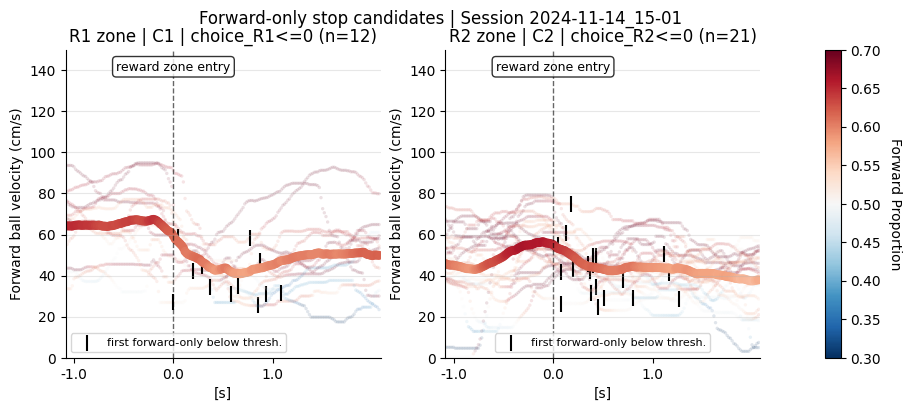


Plotting session 2024-11-14_16-40 trial numbers:
R1/C1 trials (6): [14, 19, 24, 59, 60, 63]
R2/C2 trials (15): [13, 30, 34, 41, 42, 43, 50, 51, 52, 72, 73, 81, 85, 89, 99]


/tmp/ipykernel_3054877/231610100.py:300: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0.05, 1, 0.95])


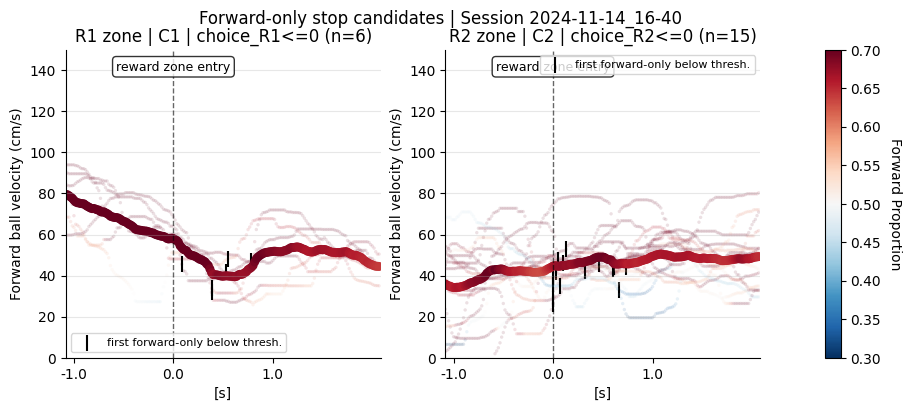


Plotting session 2024-11-15_15-48 trial numbers:
R1/C1 trials (15): [2, 10, 18, 22, 54, 60, 62, 63, 76, 81, 83, 101, 102, 105, 112]
R2/C2 trials (20): [7, 8, 9, 16, 24, 30, 45, 53, 55, 59, 64, 68, 71, 82, 85, 90, 93, 98, 111, 113]


/tmp/ipykernel_3054877/231610100.py:300: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0.05, 1, 0.95])


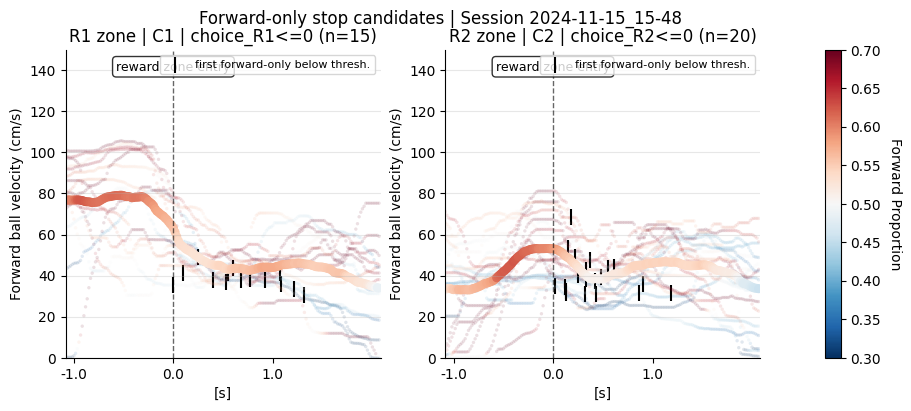


Plotting session 2024-11-20_17-46 trial numbers:
R1/C1 trials (10): [11, 15, 16, 25, 34, 39, 41, 47, 50, 58]
R2/C2 trials (7): [31, 36, 53, 59, 60, 61, 66]


/tmp/ipykernel_3054877/231610100.py:300: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0.05, 1, 0.95])


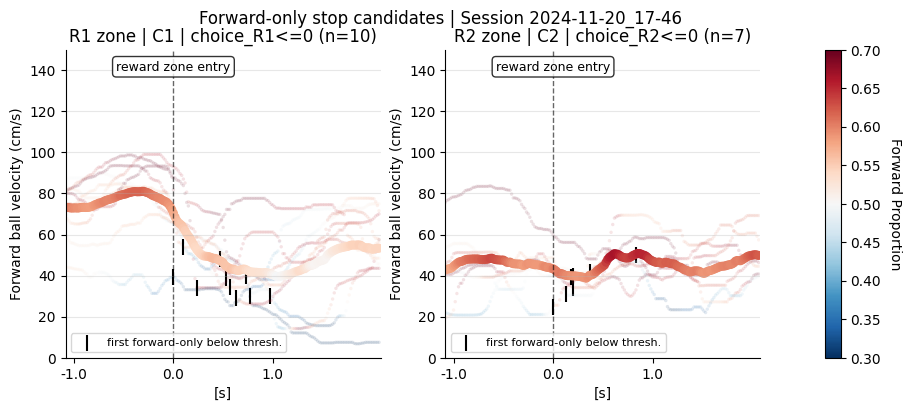


Plotting session 2024-11-21_17-22 trial numbers:
R1/C1 trials (9): [18, 19, 31, 36, 37, 42, 48, 49, 53]
R2/C2 trials (3): [32, 38, 40]


/tmp/ipykernel_3054877/231610100.py:300: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0.05, 1, 0.95])


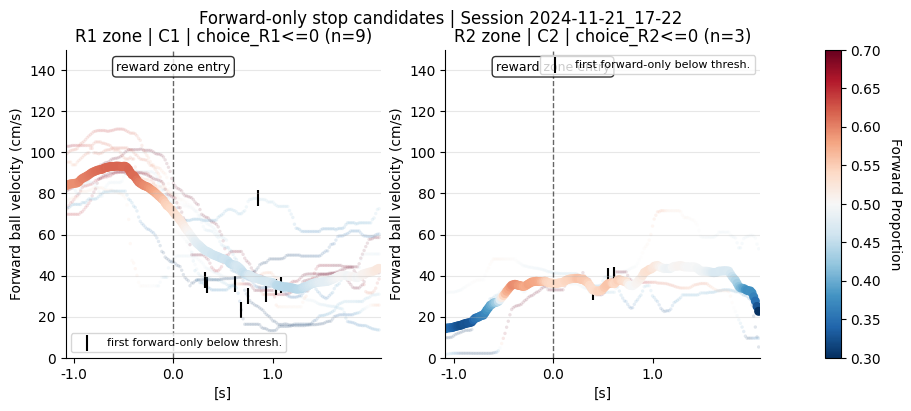


Plotting session 2024-11-22_16-01 trial numbers:
R1/C1 trials (9): [6, 7, 8, 12, 17, 20, 27, 57, 64]
R2/C2 trials (6): [1, 18, 24, 25, 39, 55]


/tmp/ipykernel_3054877/231610100.py:300: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0.05, 1, 0.95])


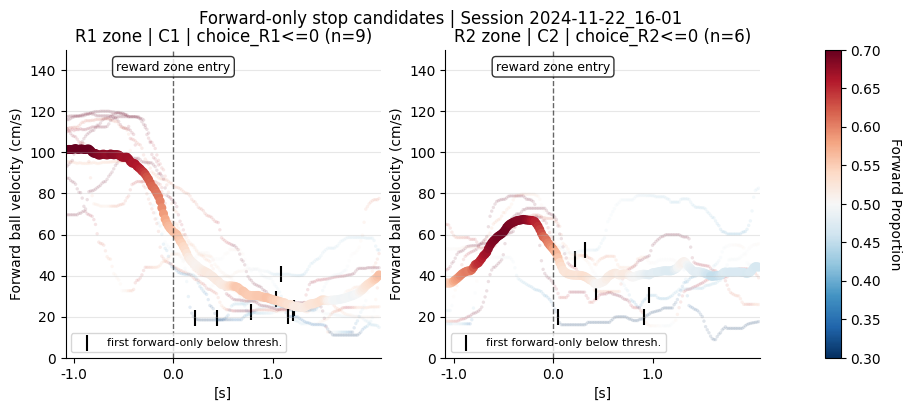


Plotting session 2024-11-25_16-25 trial numbers:
R1/C1 trials (9): [5, 10, 13, 16, 25, 32, 37, 38, 40]
R2/C2 trials (3): [19, 36, 49]


/tmp/ipykernel_3054877/231610100.py:300: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0.05, 1, 0.95])


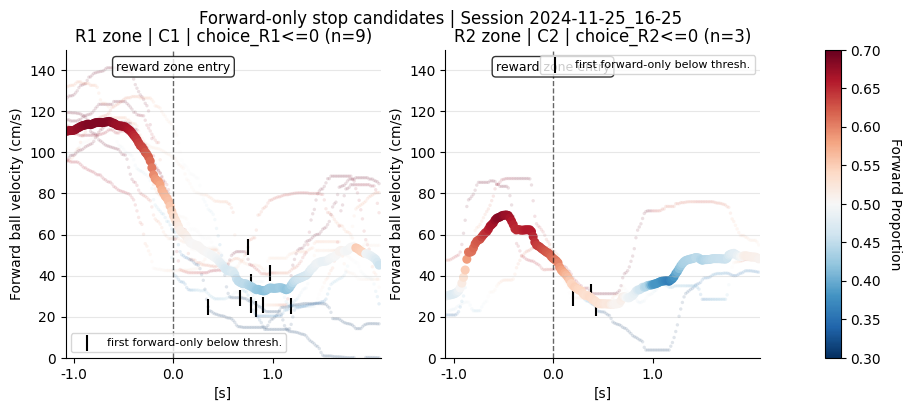


Plotting session 2024-11-26_16-39 trial numbers:
R1/C1 trials (6): [17, 21, 27, 41, 76, 80]
R2/C2 trials (6): [11, 49, 68, 70, 81, 84]


/tmp/ipykernel_3054877/231610100.py:300: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0.05, 1, 0.95])


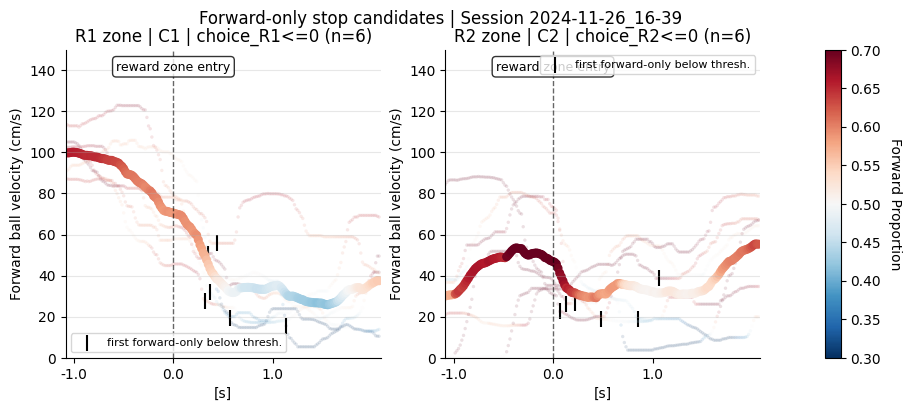


Plotting session 2024-11-27_16-11 trial numbers:
R1/C1 trials (4): [1, 30, 85, 89]
R2/C2 trials (4): [14, 17, 55, 90]


/tmp/ipykernel_3054877/231610100.py:300: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0.05, 1, 0.95])


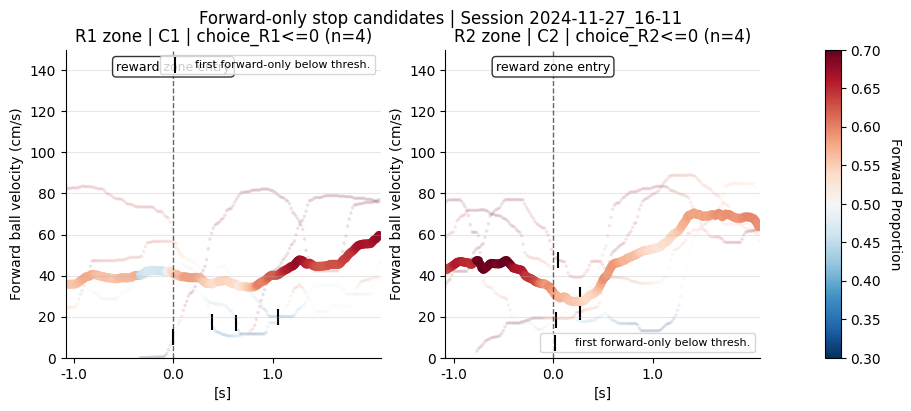


Plotting session 2024-11-28_17-41 trial numbers:
R1/C1 trials (8): [6, 8, 10, 90, 99, 102, 123, 127]
R2/C2 trials (9): [4, 12, 45, 77, 88, 91, 98, 105, 124]


/tmp/ipykernel_3054877/231610100.py:300: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0.05, 1, 0.95])


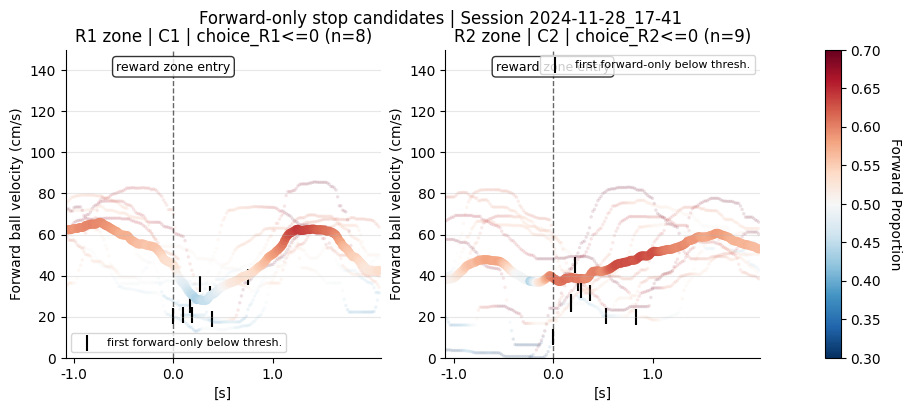


Plotting session 2024-11-29_17-21 trial numbers:
R1/C1 trials (4): [16, 75, 80, 86]
R2/C2 trials (11): [8, 10, 17, 25, 29, 37, 42, 50, 61, 74, 82]


/tmp/ipykernel_3054877/231610100.py:300: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0.05, 1, 0.95])


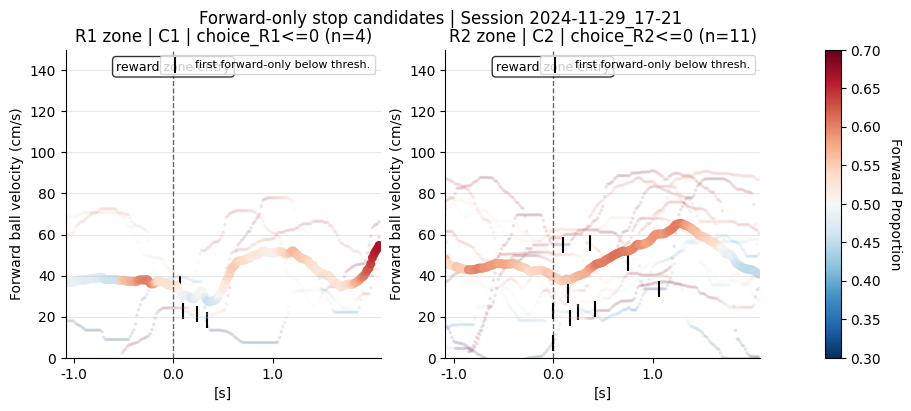


Plotting session 2024-12-02_16-09 trial numbers:
R1/C1 trials (3): [8, 18, 94]
R2/C2 trials (9): [3, 20, 24, 31, 33, 40, 44, 60, 75]


/tmp/ipykernel_3054877/231610100.py:300: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0.05, 1, 0.95])


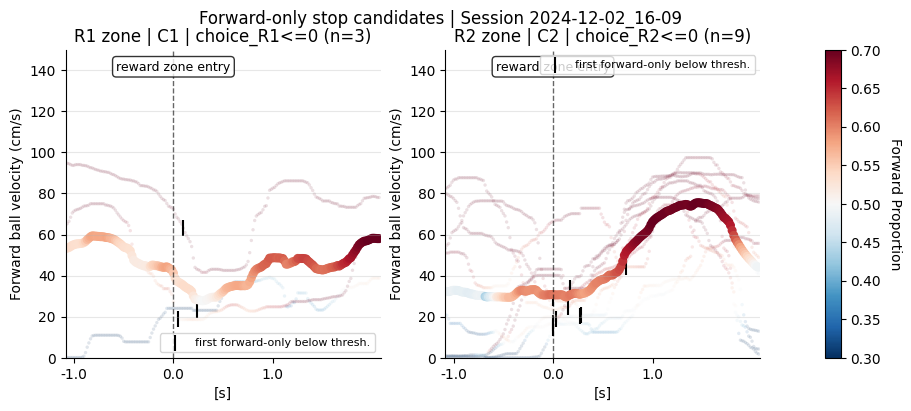


Plotting session 2024-12-03_16-23 trial numbers:
R1/C1 trials (3): [49, 65, 89]
R2/C2 trials (6): [6, 18, 23, 27, 42, 70]


/tmp/ipykernel_3054877/231610100.py:300: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0.05, 1, 0.95])


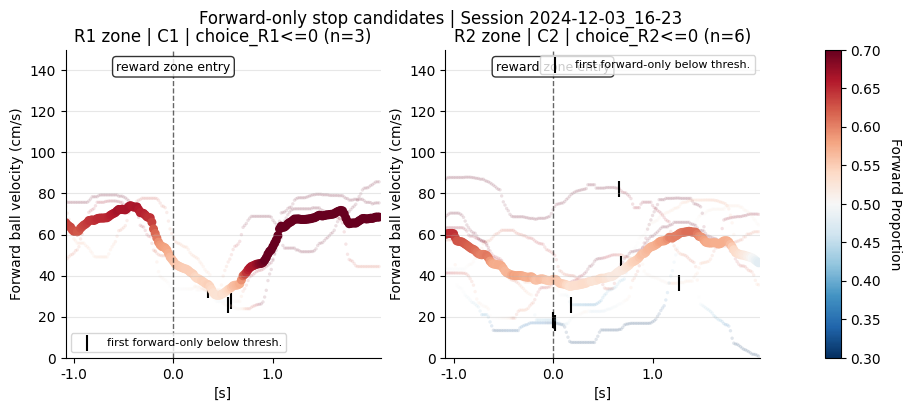


Plotting session 2024-12-04_18-06 trial numbers:
R1/C1 trials (2): [76, 109]
R2/C2 trials (6): [5, 11, 12, 17, 91, 105]


/tmp/ipykernel_3054877/231610100.py:300: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0.05, 1, 0.95])


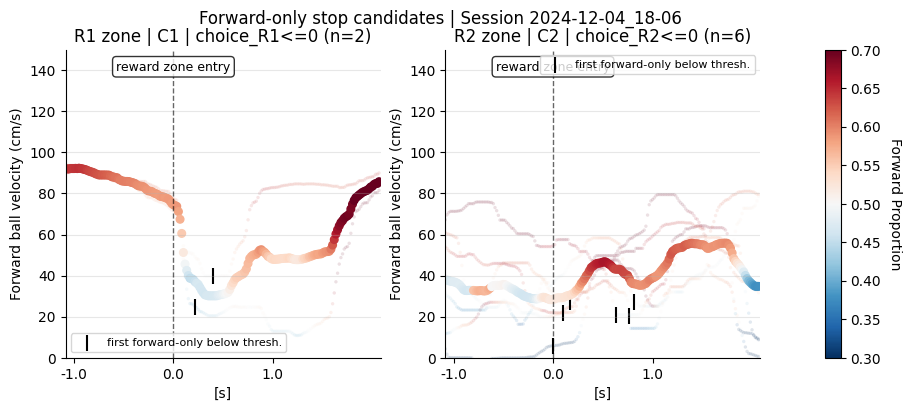


Plotting session 2024-12-06_16-49 trial numbers:
R1/C1 trials (1): [30]
R2/C2 trials (6): [2, 16, 26, 38, 45, 53]


/tmp/ipykernel_3054877/231610100.py:300: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0.05, 1, 0.95])


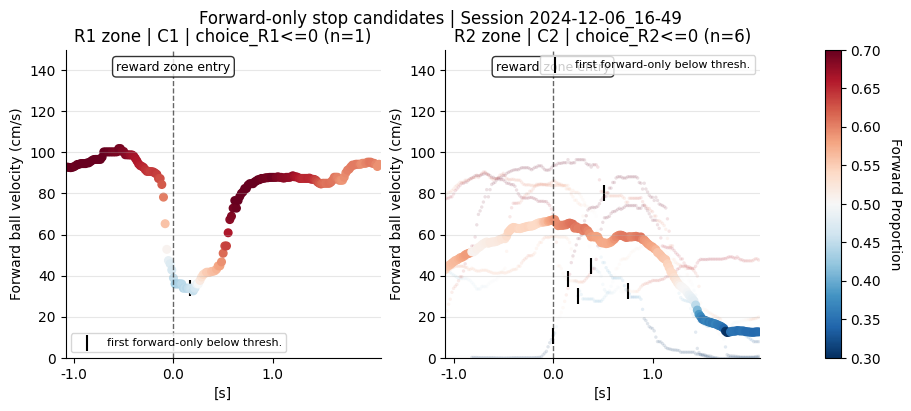


Plotting session 2024-12-09_17-45 trial numbers:
R1/C1 trials (3): [57, 68, 74]
R2/C2 trials (6): [3, 6, 9, 34, 56, 75]


/tmp/ipykernel_3054877/231610100.py:300: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0.05, 1, 0.95])


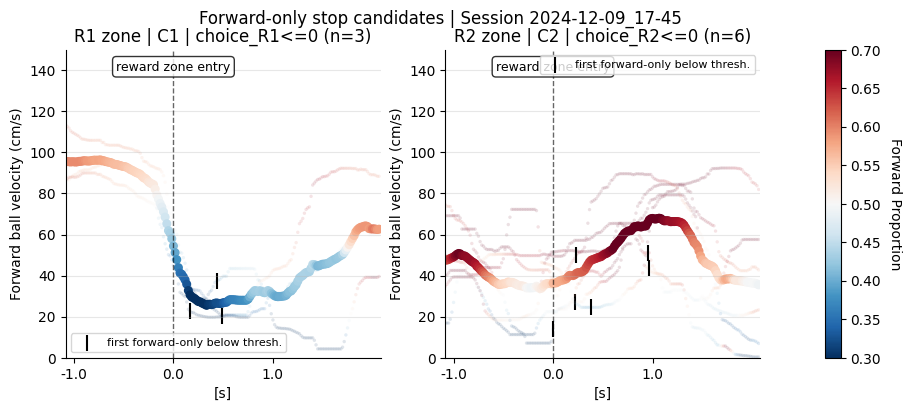


Plotting session 2024-12-10_17-20 trial numbers:
R1/C1 trials (3): [70, 73, 75]
R2/C2 trials (5): [1, 14, 22, 25, 79]


/tmp/ipykernel_3054877/231610100.py:300: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0.05, 1, 0.95])


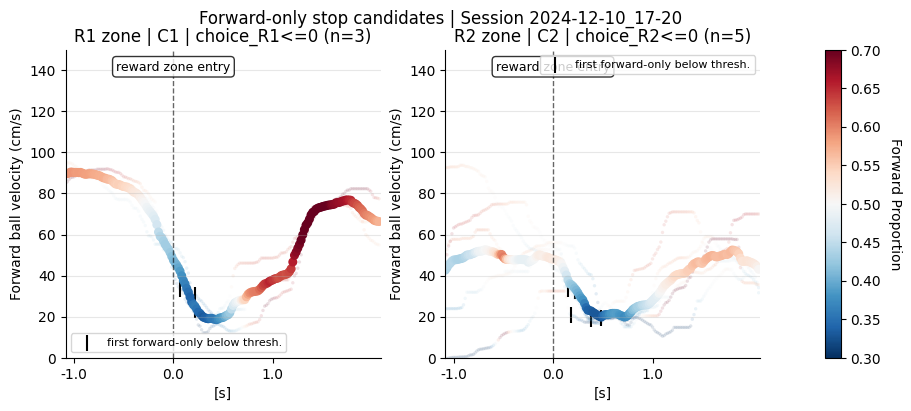


Plotting session 2024-12-11_17-42 trial numbers:
R1/C1 trials (10): [8, 12, 15, 17, 19, 25, 35, 36, 52, 62]
R2/C2 trials (3): [34, 94, 101]


/tmp/ipykernel_3054877/231610100.py:300: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0.05, 1, 0.95])


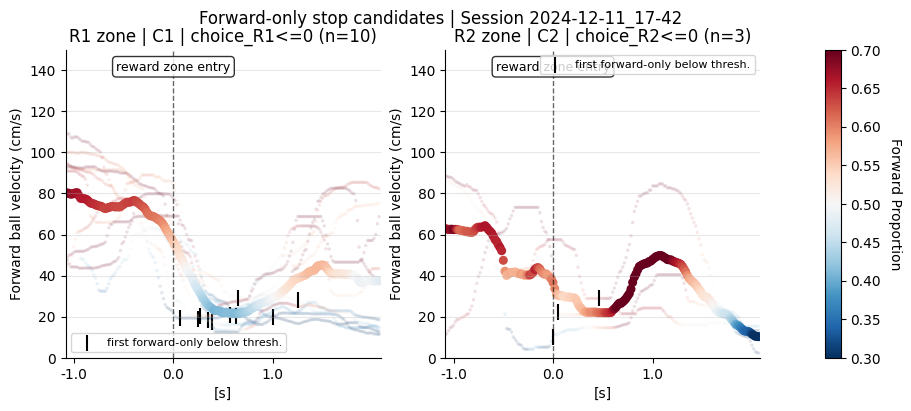


Plotting session 2024-12-12_16-13 trial numbers:
R1/C1 trials (2): [42, 72]
R2/C2 trials (4): [18, 19, 39, 49]


/tmp/ipykernel_3054877/231610100.py:300: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0.05, 1, 0.95])


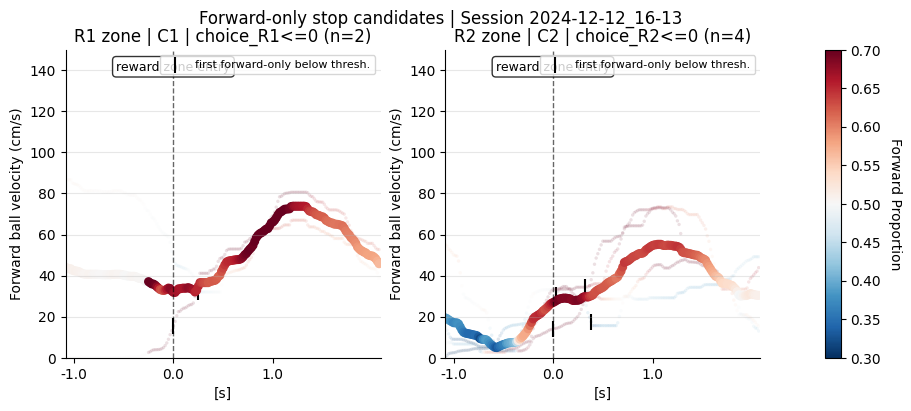


Plotting session 2024-12-13_17-10 trial numbers:
R1/C1 trials (6): [3, 39, 44, 87, 89, 111]
R2/C2 trials (5): [25, 36, 45, 52, 100]


/tmp/ipykernel_3054877/231610100.py:300: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0.05, 1, 0.95])


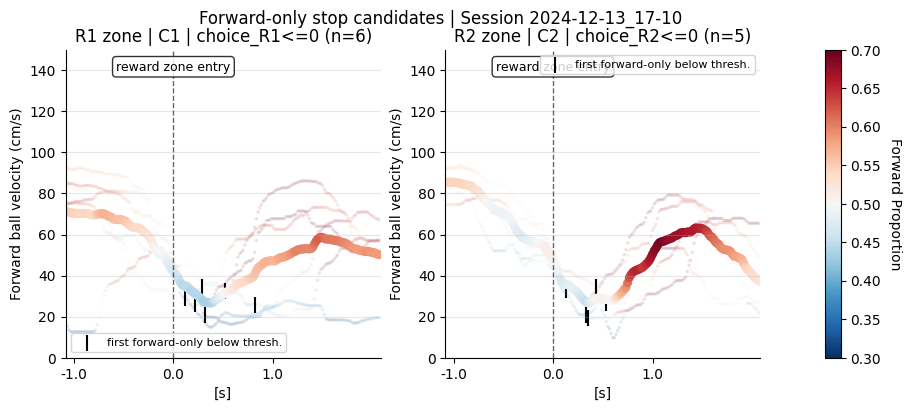


Plotting session 2025-01-14_18-08 trial numbers:
R1/C1 trials (3): [33, 45, 67]
R2/C2 trials (1): [2]


/tmp/ipykernel_3054877/231610100.py:300: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0.05, 1, 0.95])


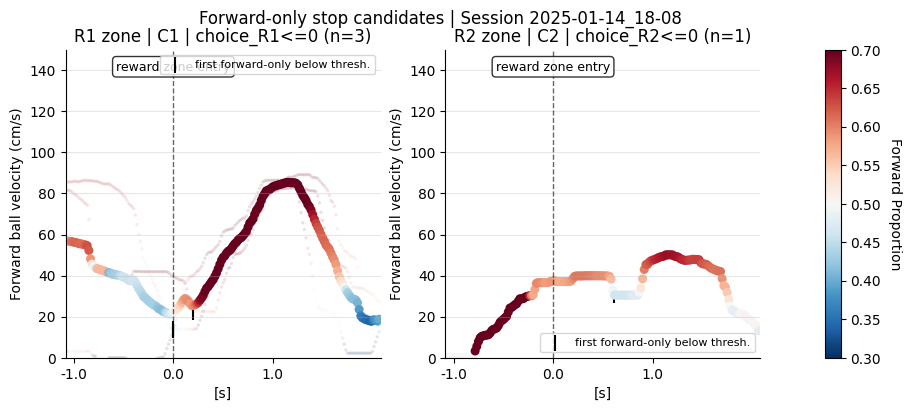


Plotting session 2025-01-15_17-18 trial numbers:
R1/C1 trials (6): [6, 47, 49, 50, 67, 83]
R2/C2 trials (2): [31, 72]


/tmp/ipykernel_3054877/231610100.py:300: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0.05, 1, 0.95])


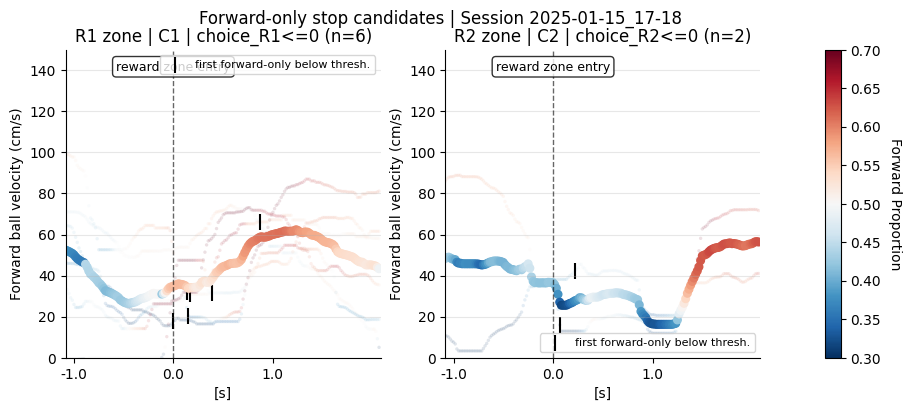


Plotting session 2025-01-16_17-47 trial numbers:
R1/C1 trials (11): [7, 14, 15, 37, 47, 50, 51, 61, 93, 95, 101]
R2/C2 trials (5): [22, 40, 52, 87, 106]


/tmp/ipykernel_3054877/231610100.py:300: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0.05, 1, 0.95])


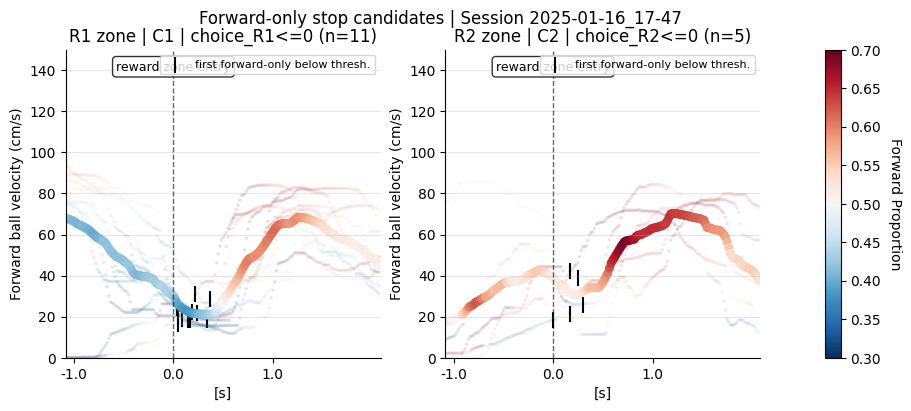


Plotting session 2025-01-17_16-55 trial numbers:
R1/C1 trials (6): [23, 25, 26, 35, 36, 67]
R2/C2 trials (4): [1, 61, 82, 91]


/tmp/ipykernel_3054877/231610100.py:300: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0.05, 1, 0.95])


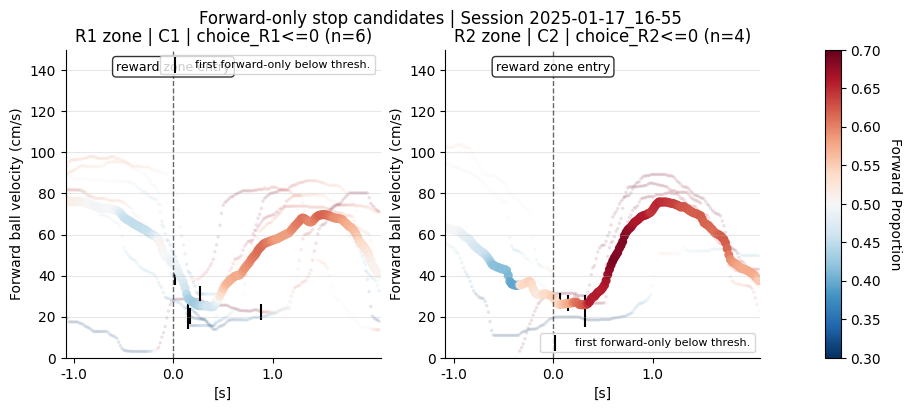


Plotting session 2025-01-21_18-49 trial numbers:
R1/C1 trials (8): [43, 45, 46, 50, 52, 53, 57, 64]
R2/C2 trials (0): []


/tmp/ipykernel_3054877/231610100.py:293: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axis.legend(loc="best", fontsize=8)
/tmp/ipykernel_3054877/231610100.py:300: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0.05, 1, 0.95])


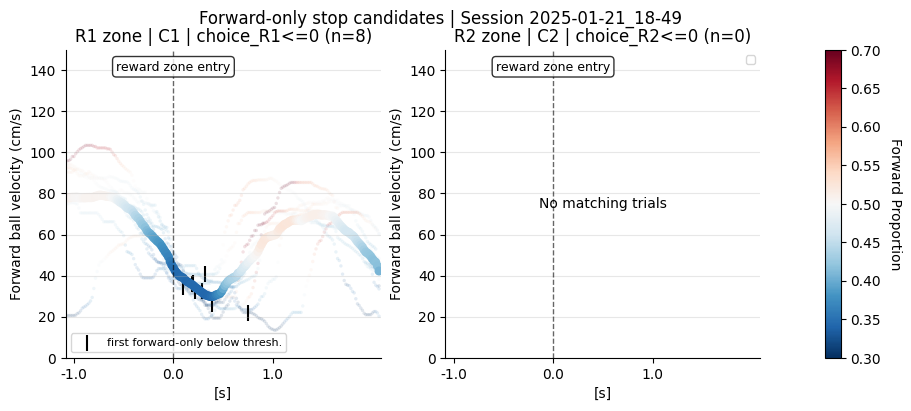


Plotting session 2025-01-23_16-48 trial numbers:
R1/C1 trials (4): [1, 46, 70, 121]
R2/C2 trials (13): [37, 44, 45, 51, 68, 69, 89, 90, 103, 105, 114, 116, 127]


/tmp/ipykernel_3054877/231610100.py:300: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0.05, 1, 0.95])


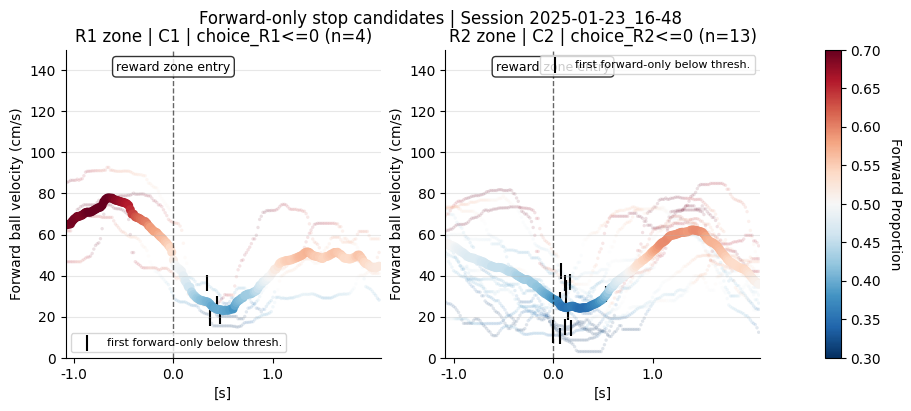


Plotting session 2025-01-24_12-24 trial numbers:
R1/C1 trials (4): [18, 22, 49, 75]
R2/C2 trials (5): [8, 16, 40, 44, 63]


/tmp/ipykernel_3054877/231610100.py:300: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0.05, 1, 0.95])


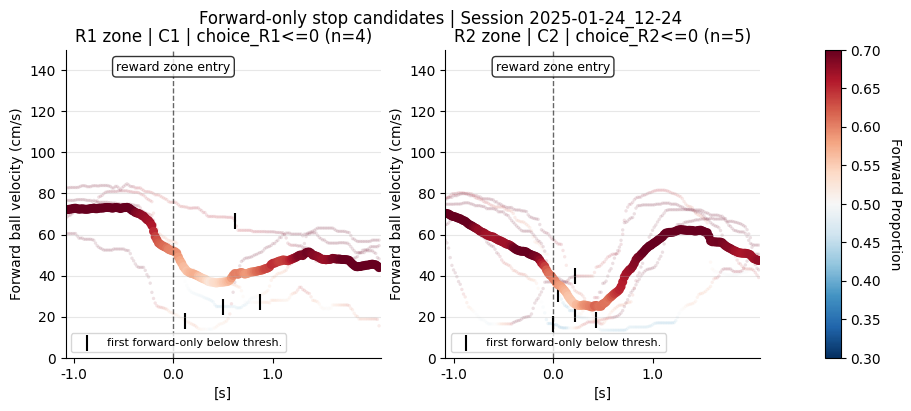


Plotting session 2025-01-24_19-37 trial numbers:
R1/C1 trials (13): [2, 8, 10, 38, 45, 57, 59, 76, 90, 102, 107, 115, 119]
R2/C2 trials (10): [1, 13, 34, 44, 50, 60, 68, 103, 105, 108]


/tmp/ipykernel_3054877/231610100.py:300: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0.05, 1, 0.95])


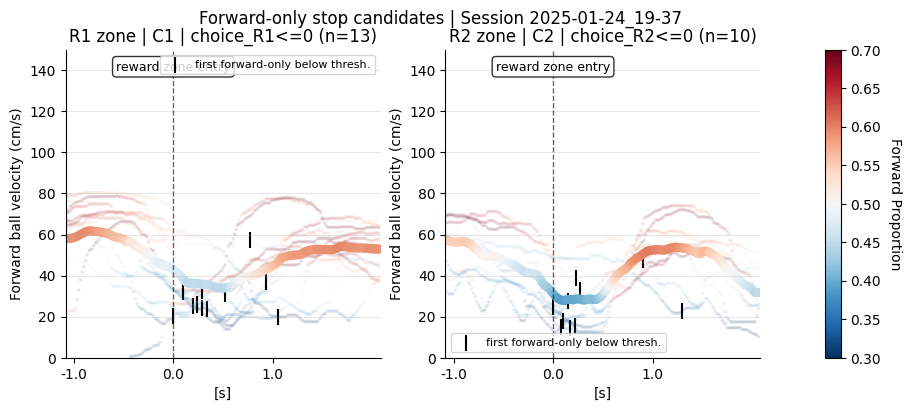


Plotting session 2025-01-25_10-55 trial numbers:
R1/C1 trials (3): [19, 103, 149]
R2/C2 trials (2): [124, 134]


/tmp/ipykernel_3054877/231610100.py:300: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0.05, 1, 0.95])


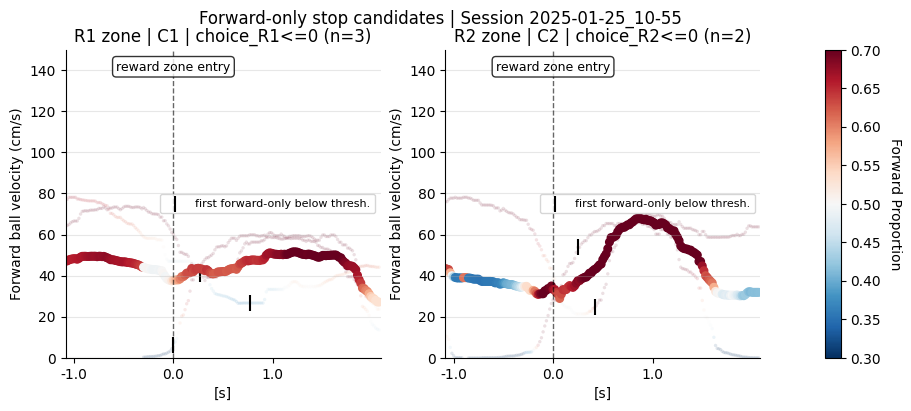


Plotting session 2025-01-25_21-29 trial numbers:
R1/C1 trials (38): [1, 2, 8, 9, 13, 16, 20, 22, 27, 31, 37, 41, 50, 54, 60, 62, 66, 70, 75, 78, 79, 83, 86, 87, 94, 96, 98, 106, 112, 115, 120, 145, 160, 165, 167, 172, 183, 185]
R2/C2 trials (2): [95, 134]


/tmp/ipykernel_3054877/231610100.py:300: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0.05, 1, 0.95])


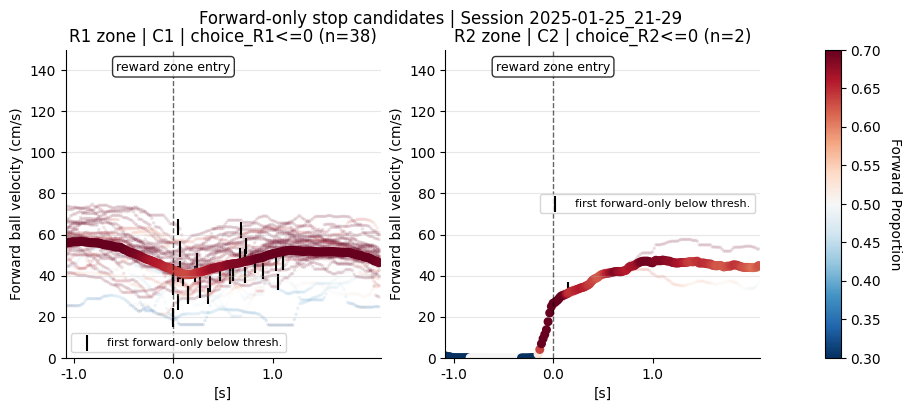


Plotting session 2025-01-26_13-45 trial numbers:
R1/C1 trials (10): [19, 30, 46, 53, 131, 132, 133, 136, 156, 158]
R2/C2 trials (0): []


/tmp/ipykernel_3054877/231610100.py:293: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axis.legend(loc="best", fontsize=8)
/tmp/ipykernel_3054877/231610100.py:300: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0.05, 1, 0.95])


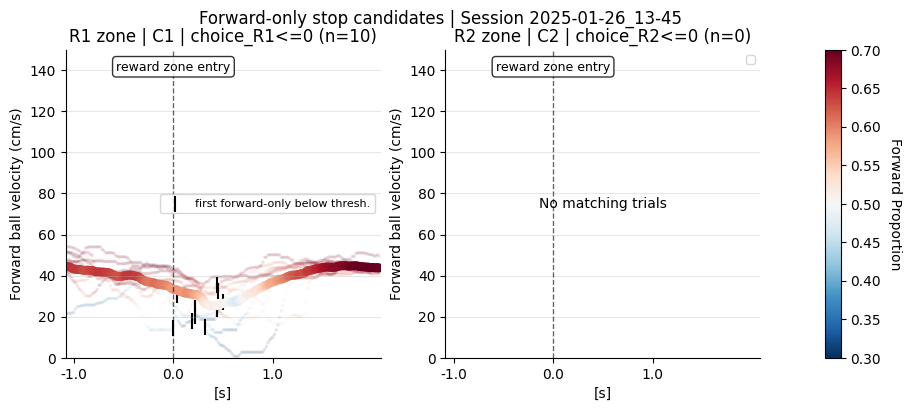


Plotting session 2025-01-26_21-48 trial numbers:
R1/C1 trials (6): [7, 61, 72, 94, 128, 147]
R2/C2 trials (1): [142]


/tmp/ipykernel_3054877/231610100.py:300: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0.05, 1, 0.95])


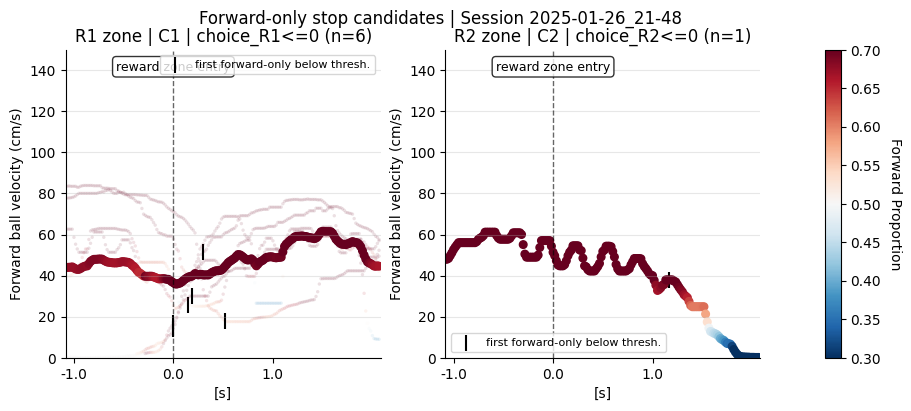


Plotting session 2025-01-27_13-39 trial numbers:
R1/C1 trials (32): [11, 15, 17, 30, 35, 39, 43, 49, 53, 58, 60, 61, 62, 66, 68, 69, 74, 76, 78, 84, 85, 87, 99, 101, 111, 116, 121, 127, 128, 133, 144, 147]
R2/C2 trials (5): [64, 65, 124, 132, 141]


/tmp/ipykernel_3054877/231610100.py:300: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0.05, 1, 0.95])


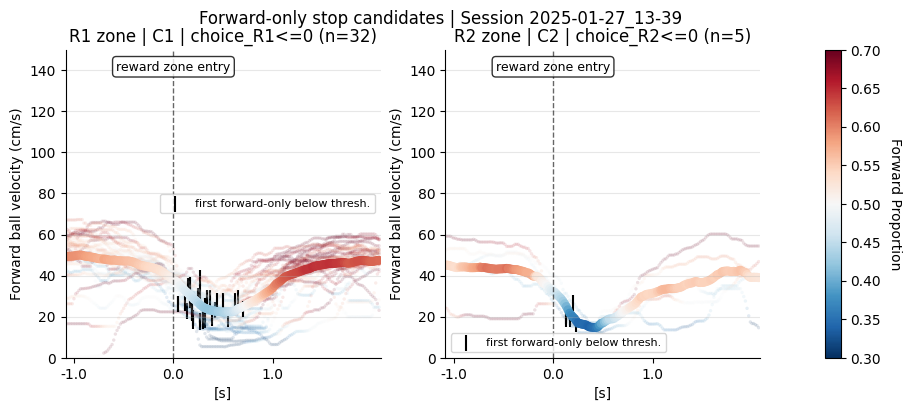

,reward_zone,session_id,trial_id,cue,choice_R1,choice_R2,choice_col,threshold_col,velocity_threshold,fps,forward_threshold,n_forward_only_below_thr,n_total_motion_below_thr,min_abs_frame_raw_in_zone,first_forward_only_entry_id
0,R1,2024-11-14_15-01,2,1.0,0.0,0.0,choice_R1,velocity_threshold_at_R1,0.3,59.9988,17.99964,12,0,13.599352,1294.0
1,R1,2024-11-14_15-01,3,1.0,0.0,0.0,choice_R1,velocity_threshold_at_R1,0.3,59.9988,17.99964,3,0,11.498538,2099.0
2,R1,2024-11-14_15-01,18,1.0,0.0,0.0,choice_R1,velocity_threshold_at_R1,0.4,59.9988,23.99952,6,0,20.447738,14535.0
3,R1,2024-11-14_15-01,22,1.0,0.0,0.0,choice_R1,velocity_threshold_at_R1,0.5,60.0024,30.00120,20,0,20.543960,17838.0
4,R1,2024-11-14_15-01,27,1.0,0.0,0.0,choice_R1,velocity_threshold_at_R1,0.5,60.0024,30.00120,4,0,12.304914,21863.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
469,R2,2025-01-27_13-39,64,2.0,0.0,0.0,choice_R2,velocity_threshold_at_R2,0.3,59.9988,17.99964,29,0,7.772457,108969.0
470,R2,2025-01-27_13-39,65,2.0,0.0,0.0,choice_R2,velocity_threshold_at_R2,0.3,59.9988,17.99964,41,0,5.086362,110154.0
471,R2,2025-01-27_13-39,124,2.0,0.0,0.0,choice_R2,velocity_threshold_at_R2,0.3,59.9988,17.99964,19,0,1.295410,219935.0
472,R2,2025-01-27_13-39,132,2.0,0.0,0.0,choice_R2,velocity_threshold_at_R2,0.3,59.9988,17.99964,17,0,8.786588,231609.0


In [14]:
forward_only_y_col = "frame_raw_500msMedian"
forward_only_color_col = "frame_forward_prop"
forward_only_cmap = "RdBu_r"
forward_only_color_vmin = .3
forward_only_color_vmax = .7
forward_only_nframes_pre = globals().get("nframes_pre", 65)
forward_only_nframes_post = globals().get("nframes_post", 125)

forward_only_targets = [
    {
        "label": "R1",
        "target_cue": 1,
        "track_zone": "reward1Zone",
        "choice_col": "choice_R1",
        "threshold_col": "velocity_threshold_at_R1",
    },
    {
        "label": "R2",
        "target_cue": 2,
        "track_zone": "reward2Zone",
        "choice_col": "choice_R2",
        "threshold_col": "velocity_threshold_at_R2",
    },
]

def format_trial_id(trial_id):
    if isinstance(trial_id, (int, float, np.integer, np.floating)) and float(trial_id).is_integer():
        return int(trial_id)
    return trial_id

def format_trial_list(trial_ids):
    return [format_trial_id(trial_id) for trial_id in trial_ids]

def summarize_forward_only_candidates(target):
    zone_frames = framew_beh.loc[framew_beh["track_zone"].eq(target["track_zone"])].copy()
    if zone_frames.empty:
        return pd.DataFrame()

    zone_frames["_session_id"] = zone_frames.index.get_level_values("session_id")
    zone_frames["_entry_id"] = zone_frames.index.get_level_values("entry_id")

    numeric_cols = [
        "trial_id",
        "cue",
        "choice_R1",
        "choice_R2",
        "frame_raw",
        "frame_RawYawPitch_abs_vel_sum",
        target["threshold_col"],
        "fps",
    ]
    for col in numeric_cols:
        zone_frames[col] = pd.to_numeric(zone_frames[col], errors="coerce")

    zone_frames = zone_frames.dropna(
        subset=[
            "_session_id",
            "trial_id",
            "cue",
            target["choice_col"],
            "frame_raw",
            "frame_RawYawPitch_abs_vel_sum",
            target["threshold_col"],
            "fps",
        ]
    )
    zone_frames["abs_frame_raw"] = zone_frames["frame_raw"].abs()
    zone_frames["forward_threshold"] = zone_frames[target["threshold_col"]] * zone_frames["fps"]
    zone_frames["forward_only_below_thr"] = zone_frames["abs_frame_raw"] < zone_frames["forward_threshold"]
    zone_frames["total_motion_below_thr"] = (
        zone_frames["frame_RawYawPitch_abs_vel_sum"] < zone_frames["forward_threshold"]
    )

    grouped = zone_frames.groupby(["_session_id", "trial_id"], sort=False)
    summary = grouped.agg(
        cue=("cue", "first"),
        choice_R1=("choice_R1", "first"),
        choice_R2=("choice_R2", "first"),
        velocity_threshold=(target["threshold_col"], "first"),
        fps=("fps", "median"),
        forward_threshold=("forward_threshold", "median"),
        n_forward_only_below_thr=("forward_only_below_thr", "sum"),
        n_total_motion_below_thr=("total_motion_below_thr", "sum"),
        min_abs_frame_raw_in_zone=("abs_frame_raw", "min"),
    )
    summary["first_forward_only_entry_id"] = grouped.apply(
        lambda trial: trial.loc[trial["forward_only_below_thr"], "_entry_id"].iloc[0]
        if trial["forward_only_below_thr"].any()
        else np.nan
    )
    summary = summary.reset_index().rename(columns={"_session_id": "session_id"})
    summary["n_forward_only_below_thr"] = summary["n_forward_only_below_thr"].astype(int)
    summary["n_total_motion_below_thr"] = summary["n_total_motion_below_thr"].astype(int)
    summary["reward_zone"] = target["label"]
    summary["target_cue"] = target["target_cue"]
    summary["track_zone"] = target["track_zone"]
    summary["choice_col"] = target["choice_col"]
    summary["threshold_col"] = target["threshold_col"]

    actual_skip_mask = pd.to_numeric(summary[target["choice_col"]], errors="coerce").fillna(0).le(0)
    cue_mask = pd.to_numeric(summary["cue"], errors="coerce").eq(target["target_cue"])
    forward_only_stop_mask = summary["n_forward_only_below_thr"].gt(0)
    candidates = summary.loc[actual_skip_mask & cue_mask & forward_only_stop_mask].copy()
    return candidates

forward_only_candidates = pd.concat(
    [summarize_forward_only_candidates(target) for target in forward_only_targets],
    ignore_index=True,
)

summary_cols = [
    "reward_zone",
    "session_id",
    "trial_id",
    "cue",
    "choice_R1",
    "choice_R2",
    "choice_col",
    "threshold_col",
    "velocity_threshold",
    "fps",
    "forward_threshold",
    "n_forward_only_below_thr",
    "n_total_motion_below_thr",
    "min_abs_frame_raw_in_zone",
]

print("Forward-only R1/R2 stop candidate search")
print("R1/C1 actual skip definition: choice_R1 <= 0 in cue==1 trials")
print("R2/C2 actual skip definition: choice_R2 <= 0 in cue==2 trials")
print("Forward-only stop rule: abs(frame_raw) < velocity_threshold_at_R*fps inside the matching reward zone")
print("Time criterion: at least 1 reward-zone frame below threshold; no consecutive-frame requirement")
print(f"Matching trials: {len(forward_only_candidates)}")

if forward_only_candidates.empty:
    print("No C1/R1 or C2/R2 skip trials would count as forward-only stop trials.")
else:
    print("\nPer-session candidate counts:")
    print(
        forward_only_candidates
        .pivot_table(index="session_id", columns="reward_zone", values="trial_id", aggfunc="count", fill_value=0)
        .astype(int)
        .to_string()
    )
    print("\nCandidate summary:")
    print(forward_only_candidates[summary_cols].to_string(index=False))

def build_zone_window(session_id, session_candidates):
    if session_candidates.empty:
        return pd.DataFrame()

    session_frames = framew_beh.xs(session_id, level="session_id").reset_index()
    chunks = []
    for _, candidate in session_candidates.iterrows():
        trial_id = candidate["trial_id"]
        trial_mask = pd.to_numeric(session_frames["trial_id"], errors="coerce").eq(trial_id)
        trial_frames = session_frames.loc[trial_mask].copy()
        if trial_frames.empty:
            continue

        zone_locs = np.flatnonzero(trial_frames["track_zone"].eq(candidate["track_zone"]).to_numpy())
        if len(zone_locs) == 0:
            continue

        zone_entry_loc = zone_locs[0]
        start = max(0, zone_entry_loc - forward_only_nframes_pre)
        stop = min(len(trial_frames), zone_entry_loc + forward_only_nframes_post)
        window = trial_frames.iloc[start:stop].copy()
        window["rel_frame"] = np.arange(start, stop) - zone_entry_loc
        window["_candidate_trial_id"] = trial_id
        window["_reward_zone"] = candidate["reward_zone"]
        window["_first_forward_only_entry_id"] = candidate["first_forward_only_entry_id"]
        chunks.append(window)

    if not chunks:
        return pd.DataFrame()
    return pd.concat(chunks, ignore_index=True)

def plot_candidate_panel(axis, panel_data, panel_candidates, title):
    if panel_candidates.empty:
        axis.text(0.5, 0.5, "No matching trials", ha="center", va="center", transform=axis.transAxes)
        axis.set_title(f"{title} (n=0)")
        return None, False

    trial_ids = panel_candidates["trial_id"].drop_duplicates().tolist()
    if panel_data.empty:
        print(f"{title}: no plotted window frames found for trials {format_trial_list(trial_ids)}")
        axis.text(0.5, 0.5, "No plotted frames", ha="center", va="center", transform=axis.transAxes)
        axis.set_title(f"{title} (n={len(trial_ids)})")
        return None, False

    sc_for_cbar = None
    marker_labeled = False
    missing_marker_count = 0

    for trial_id, trial_data in panel_data.groupby("_candidate_trial_id", sort=False):
        sc_for_cbar = axis.scatter(
            trial_data["rel_frame"],
            trial_data[forward_only_y_col],
            c=trial_data[forward_only_color_col],
            alpha=0.12,
            s=6,
            cmap=forward_only_cmap,
            vmin=forward_only_color_vmin,
            vmax=forward_only_color_vmax,
            linewidths=0,
        )

        first_entry_id = trial_data["_first_forward_only_entry_id"].iloc[0]
        marker_rows = trial_data[trial_data["entry_id"].eq(first_entry_id)]
        if marker_rows.empty:
            missing_marker_count += 1
        else:
            marker_row = marker_rows.iloc[0]
            axis.scatter(
                [marker_row["rel_frame"]],
                [marker_row[forward_only_y_col]],
                marker="|",
                s=140,
                color="k",
                label="first forward-only below thresh." if not marker_labeled else None,
            )
            marker_labeled = True

    mean_trace = (
        panel_data.groupby("rel_frame", as_index=False)[[forward_only_y_col, forward_only_color_col]]
        .mean()
        .dropna(subset=[forward_only_y_col])
    )
    if not mean_trace.empty:
        sc_for_cbar = axis.scatter(
            mean_trace["rel_frame"],
            mean_trace[forward_only_y_col],
            c=mean_trace[forward_only_color_col],
            s=30,
            cmap=forward_only_cmap,
            vmin=forward_only_color_vmin,
            vmax=forward_only_color_vmax,
        )

    if missing_marker_count:
        print(f"{title}: {missing_marker_count} first forward-only threshold markers fell outside the plotted window.")

    axis.set_title(f"{title} (n={len(trial_ids)})")
    return sc_for_cbar, marker_labeled

def plot_forward_only_candidate_session(session_id, session_candidates):
    fig = plt.figure(figsize=(10, 4))
    gs = fig.add_gridspec(1, 3, width_ratios=[1, 1, 0.05], wspace=0.3)
    ax = [fig.add_subplot(gs[0, 0]), fig.add_subplot(gs[0, 1])]
    cax = fig.add_subplot(gs[0, 2])

    print(f"\nPlotting session {session_id} trial numbers:")
    sc_for_cbar = None
    any_marker_labeled = False

    for axis, target in zip(ax, forward_only_targets):
        panel_candidates = session_candidates[session_candidates["reward_zone"].eq(target["label"])]
        trial_ids = panel_candidates["trial_id"].drop_duplicates().tolist()
        print(f"{target['label']}/C{target['target_cue']} trials ({len(trial_ids)}): {format_trial_list(trial_ids)}")
        panel_data = build_zone_window(session_id, panel_candidates)
        sc, marker_labeled = plot_candidate_panel(
            axis,
            panel_data,
            panel_candidates,
            f"{target['label']} zone | C{target['target_cue']} | {target['choice_col']}<=0",
        )
        sc_for_cbar = sc if sc is not None else sc_for_cbar
        any_marker_labeled = any_marker_labeled or marker_labeled

    xtick_frames = np.array([-60, 0, 60])
    xtick_times = xtick_frames
    for axis in ax:
        axis.set_xlim(-forward_only_nframes_pre, forward_only_nframes_post)
        axis.set_ylim(0, 150)
        axis.grid(True, axis="y", alpha=0.3)
        axis.set_xticks(xtick_frames)
        axis.set_xticklabels([f"{t/60:.1f}" for t in xtick_times])
        axis.set_xlabel("[s]")
        axis.set_ylabel("Forward ball velocity (cm/s)")
        axis.axvline(0, color="k", linestyle="--", linewidth=1, alpha=0.6)
        axis.text(
            0,
            140,
            "reward zone entry",
            fontsize=9,
            ha="center",
            bbox=dict(boxstyle="round", facecolor="white", alpha=0.8),
        )
        axis.spines["top"].set_visible(False)
        axis.spines["right"].set_visible(False)
        if any_marker_labeled:
            axis.legend(loc="best", fontsize=8)

    if sc_for_cbar is not None:
        cbar = plt.colorbar(sc_for_cbar, cax=cax)
        cbar.set_label("Forward Proportion", rotation=270, labelpad=15)

    fig.suptitle(f"Forward-only stop candidates | Session {session_id}", y=0.98)
    fig.tight_layout(rect=[0, 0.05, 1, 0.95])
    plt.show()

if not forward_only_candidates.empty:
    for session_id, session_candidates in forward_only_candidates.groupby("session_id", sort=False):
        plot_forward_only_candidate_session(session_id, session_candidates)

forward_only_candidate_info = forward_only_candidates[
    summary_cols + ["first_forward_only_entry_id"]
].copy()
forward_only_candidate_info["trial_id"] = forward_only_candidate_info["trial_id"].map(format_trial_id)
forward_only_candidate_info

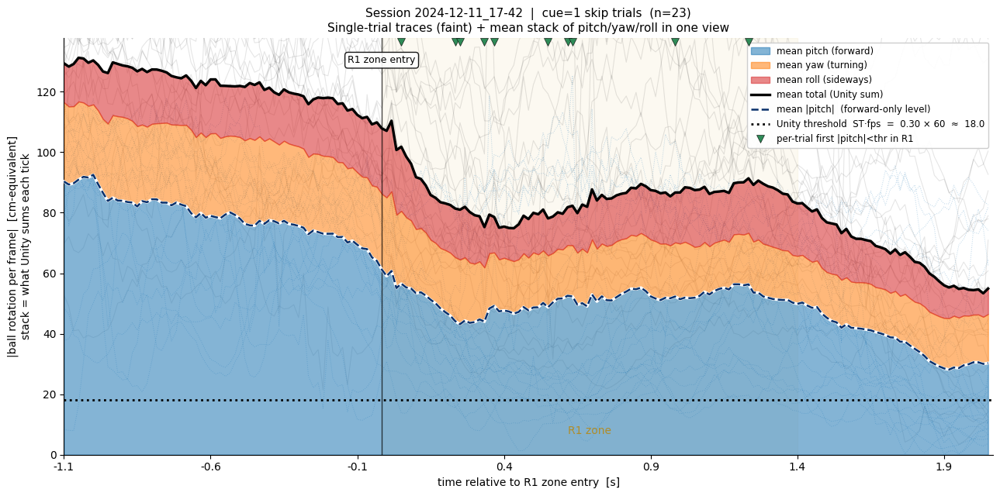

ST = 0.3, fps ≈ 60.00  ->  threshold (ST*fps) ≈ 18.00
Candidate trials (cue=1, choice_R1<=0, has R1 zone): 23
Axis mapping:
  pitch (forward)  <- frame_raw
  yaw   (turning)  <- frame_yaw
  roll  (sideways) <- frame_pitch


In [15]:
target_session = "2024-12-11_17-42"
target_cue_val = 1
window_pre, window_post = 65, 125

LABEL_PITCH = "pitch (forward)"
LABEL_YAW   = "yaw (turning)"
LABEL_ROLL  = "roll (sideways)"
COL_PITCH, COL_YAW, COL_ROLL = "#1f77b4", "#ff7f0e", "#d62728"

sf = framew_beh.xs(target_session, level="session_id").reset_index()
for c in ["trial_id", "cue", "choice_R1", "fps",
          "frame_raw", "frame_yaw", "frame_pitch", "velocity_threshold_at_R1"]:
    sf[c] = pd.to_numeric(sf[c], errors="coerce")

thr_ST  = sf["velocity_threshold_at_R1"].dropna().iloc[0]
fps_med = sf["fps"].dropna().median()
threshold = thr_ST * fps_med

# Axis mapping follows UnityRatVR/Assets/scripts/general/PlayerMovement.cs:131-153.
sf["abs_pitch"] = sf["frame_raw"].abs()
sf["abs_yaw"]   = sf["frame_yaw"].abs()
sf["abs_roll"]  = sf["frame_pitch"].abs()
sf["total"]     = sf["abs_pitch"] + sf["abs_yaw"] + sf["abs_roll"]

trial_meta = sf.dropna(subset=["trial_id"]).groupby("trial_id").agg(
    cue=("cue", "first"), choice_R1=("choice_R1", "first")
)
cand_trials = trial_meta[
    (trial_meta["cue"] == target_cue_val) & (trial_meta["choice_R1"] <= 0)
].index.tolist()

windows = []
first_below_thr_x = []
for tid in cand_trials:
    tf = sf[sf["trial_id"] == tid].reset_index(drop=True)
    r1_locs = np.flatnonzero(tf["track_zone"].eq("reward1Zone").to_numpy())
    if len(r1_locs) == 0:
        continue
    enter, exit_ = r1_locs[0], r1_locs[-1]
    s = max(0, enter - window_pre)
    e = min(len(tf), enter + window_post)
    w = tf.iloc[s:e].copy()
    w["rel_frame"] = np.arange(s, e) - enter
    w["trial_id"] = tid
    w["r1_exit_rel"] = exit_ - enter
    windows.append(w)

    in_zone = (w["rel_frame"] >= 0) & (w["rel_frame"] <= (exit_ - enter))
    pitch_below = in_zone & (w["abs_pitch"].values < threshold)
    if pitch_below.any():
        first_below_thr_x.append(w["rel_frame"].values[pitch_below][0])

n_trials = len(windows)
mean_df = (
    pd.concat(windows, ignore_index=True)
    .groupby("rel_frame")[["abs_pitch", "abs_yaw", "abs_roll", "total"]]
    .mean()
)
x = mean_df.index.values
median_exit = int(np.median([w["r1_exit_rel"].iloc[0] for w in windows]))

fig, ax = plt.subplots(figsize=(13, 6.5))

ax.axvspan(0, median_exit, color="goldenrod", alpha=0.06, zorder=0)

for w in windows:
    ax.plot(w["rel_frame"], w["abs_pitch"] + w["abs_yaw"] + w["abs_roll"],
            color="black", alpha=0.10, lw=0.8, zorder=1)
    ax.plot(w["rel_frame"], w["abs_pitch"],
            color=COL_PITCH, alpha=0.30, lw=0.7, linestyle=":", zorder=1)

y_pitch = mean_df["abs_pitch"].values
y_yaw   = y_pitch + mean_df["abs_yaw"].values
y_tot   = y_yaw   + mean_df["abs_roll"].values
ax.fill_between(x, 0,       y_pitch, color=COL_PITCH, alpha=0.55, label=f"mean {LABEL_PITCH}",  zorder=2)
ax.fill_between(x, y_pitch, y_yaw,   color=COL_YAW,   alpha=0.55, label=f"mean {LABEL_YAW}",    zorder=2)
ax.fill_between(x, y_yaw,   y_tot,   color=COL_ROLL,  alpha=0.55, label=f"mean {LABEL_ROLL}",   zorder=2)

ax.plot(x, y_tot,   color="black", lw=2.4, zorder=4, label="mean total (Unity sum)")
ax.plot(x, y_pitch, color="white", lw=2.6, zorder=4)
ax.plot(x, y_pitch, color="#08306b", lw=1.8, linestyle="--", zorder=5,
        label="mean |pitch|  (forward-only level)")

ax.axhline(threshold, color="k", linestyle=":", lw=2.0, zorder=5,
           label=f"Unity threshold  ST·fps  =  {thr_ST:.2f} × {fps_med:.0f}  ≈  {threshold:.1f}")

inside = (x >= 0) & (x <= median_exit)
miss = (y_pitch < threshold) & (y_tot >= threshold) & inside
if miss.any():
    ax.fill_between(x, threshold, y_tot, where=miss,
                    facecolor="none", hatch="///", edgecolor="seagreen", lw=0, zorder=6,
                    label="missed-reward regime\n(pitch < thr, total ≥ thr)")

ymax = max(y_tot.max() * 1.05, threshold * 1.4)
for tx in first_below_thr_x:
    ax.plot([tx], [ymax * 0.99], marker="v", color="seagreen", markersize=7,
            markeredgecolor="black", markeredgewidth=0.4, zorder=7)
if first_below_thr_x:
    ax.plot([], [], marker="v", color="seagreen", markersize=7,
            markeredgecolor="black", markeredgewidth=0.4, linestyle="",
            label="per-trial first |pitch|<thr in R1")

ax.axvline(0, color="k", lw=1.0, alpha=0.7, zorder=3)
ax.text(0, ymax * 0.94, "R1 zone entry", ha="center", fontsize=9,
        bbox=dict(boxstyle="round", facecolor="white", alpha=0.9), zorder=8)
ax.text(median_exit / 2, ymax * 0.05, "R1 zone", ha="center", fontsize=10,
        color="darkgoldenrod", alpha=0.85, zorder=8)

xt = np.arange(-window_pre, window_post + 1, 30)
ax.set_xticks(xt)
ax.set_xticklabels([f"{t/fps_med:.1f}" for t in xt])
ax.set_xlim(-window_pre, window_post)
ax.set_ylim(0, ymax)

ax.set_xlabel("time relative to R1 zone entry  [s]")
ax.set_ylabel("|ball rotation per frame|  [cm-equivalent]\nstack = what Unity sums each tick")
ax.set_title(
    f"Session {target_session}  |  cue=1 skip trials  (n={n_trials})\n"
    "Single-trial traces (faint) + mean stack of pitch/yaw/roll in one view",
    fontsize=11,
)
ax.legend(loc="upper right", fontsize=8.5, framealpha=0.95)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
plt.tight_layout()
plt.show()

print(f"ST = {thr_ST}, fps ≈ {fps_med:.2f}  ->  threshold (ST*fps) ≈ {threshold:.2f}")
print(f"Candidate trials (cue={target_cue_val}, choice_R1<=0, has R1 zone): {n_trials}")
print("Axis mapping:")
print("  pitch (forward)  <- frame_raw")
print("  yaw   (turning)  <- frame_yaw")
print("  roll  (sideways) <- frame_pitch")
